In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json

import sys
sys.path.append('../')

import utils
from utils import ax_rocs, plot_rocs, rocs_models
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
LOCAL_PC = False
root_dir = "/mnt/w" if LOCAL_PC else "/data/bodyct"
EXPERIMENT_DIR = f"{root_dir}/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst-preds"

NLST_PREDS_LOCAL = "/mnt/c/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = NLST_PREDS_LOCAL ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
nlst_preds = pd.read_csv(f'{NLST_PREDS}/nlst_demo_v1_w3preds.csv')
nlst_preds = nlst_preds[~nlst_preds['Thijmen_mean'].isna()]
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3240 entries, 0 to 16071
Data columns (total 88 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   PatientID            3240 non-null   int64  
 1   StudyDate            3240 non-null   int64  
 2   SeriesInstanceUID    3240 non-null   object 
 3   CoordX               3240 non-null   float64
 4   CoordY               3240 non-null   float64
 5   CoordZ               3240 non-null   float64
 6   LesionID             3240 non-null   int64  
 7   NoduleType           3240 non-null   object 
 8   Spiculation          3240 non-null   bool   
 9   Diameter [mm]        3240 non-null   float64
 10  Age                  3240 non-null   int64  
 11  Gender               3240 non-null   int64  
 12  FamilyHistoryLungCa  3240 non-null   bool   
 13  Emphysema            3240 non-null   bool   
 14  NoduleInUpperLung    3240 non-null   bool   
 15  NoduleCounts         3240 non-null   int64

In [3]:
nlst_preds.nunique()

PatientID            1061
StudyDate               3
SeriesInstanceUID    2062
CoordX               3054
CoordY               3090
                     ... 
cancphar                2
cancstom                2
cancthyr                2
canctran                1
study                   3
Length: 88, dtype: int64

In [4]:
with open(f'{NLST_PREDS}/nlst_demo_v1_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [5]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    "de Haas": "Thijmen_mean",
    # "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

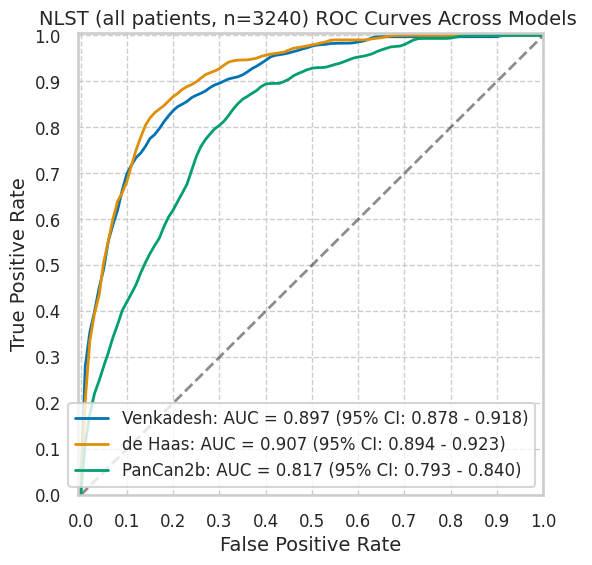

In [6]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

In [7]:
utils.stats_from_cm(*utils.cm_with_thres(nlst_preds))

{'num': 3240,
 'tp': 260,
 'fp': 1065,
 'tn': 1894,
 'fn': 21,
 'tpr': 0.9252669039145908,
 'fpr': 0.3599188915174045,
 'fnr': 0.07473309608540925,
 'tnr': 0.6400811084825955,
 'ppv': 0.19622641509433963,
 'npv': 0.9890339425587468,
 'fdr': 0.8037735849056604,
 'for': 0.010966057441253264,
 'acc': 0.6648148148148149}

## Plot results by category

In [8]:
def plot_by_category(df, cat, models=MODEL_TO_COL.keys()):
    groups = df.groupby(cat) 
    df_catinfo, plot_roc = utils.info_by_splits(groups)
    display(df_catinfo)

    if not plot_roc:
        print("Not plotting ROC since there are zero values for malignant or benign nodules :(")
        return df_catinfo

    rocs = {}
    for m in models:
        rocs[m], df_perf = utils.perf_by_splits(groups, pred_col=MODEL_TO_COL[m])
        print(m)
        display(df_perf)

    fig, ax = plt.subplots(1, len(models), figsize=(6.5*len(models) - 0.5, 6))
    fig.suptitle(f"Model Performance Split By {cat}")
    for i, m in enumerate(models):
        utils.ax_rocs(ax[i], rocs[m], title=m)
    plt.show()

    return df_catinfo        

### Included columns (from predictions)

NoduleInUpperLung


,num,pct,num_mal,pct_mal
False,1866,57.592593,113,6.055734
True,1374,42.407407,168,12.227074


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1866,103,508,1245,10,0.911504,0.289789,0.088496,0.710211,0.168576,0.992032,0.831424,0.007968,0.722401
True,1374,157,557,649,11,0.934524,0.461857,0.065476,0.538143,0.219888,0.983333,0.780112,0.016667,0.586608


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1866,108,616,1137,5,0.955752,0.351398,0.044248,0.648602,0.149171,0.995622,0.850829,0.004378,0.667203
True,1374,163,704,502,5,0.970238,0.583748,0.029762,0.416252,0.188005,0.990138,0.811995,0.009862,0.483988


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1866,99,594,1159,14,0.876106,0.338848,0.123894,0.661152,0.142857,0.988065,0.857143,0.011935,0.674169
True,1374,154,724,482,14,0.916667,0.600332,0.083333,0.399668,0.175399,0.971774,0.824601,0.028226,0.462882


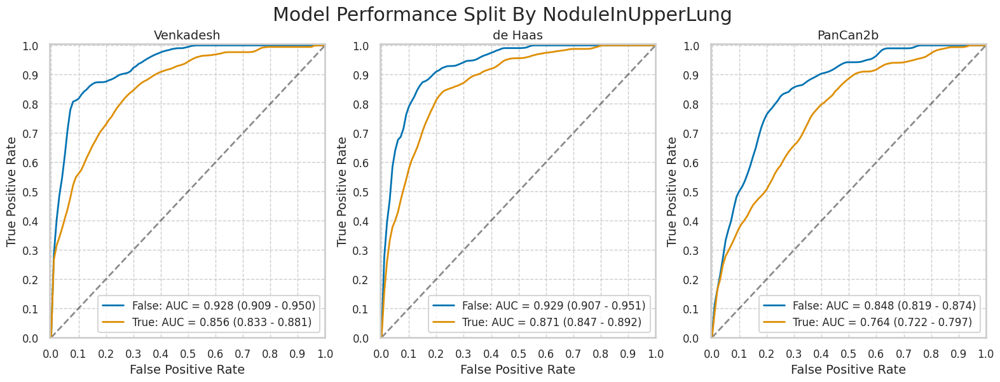

Spiculation


,num,pct,num_mal,pct_mal
False,3234,99.814815,275,8.503401
True,6,0.185185,6,100.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
NoduleType


,num,pct,num_mal,pct_mal
GroundGlassOpacity,727,22.438272,0,0.000000
NonSolid,19,0.586420,19,100.000000
PartSolid,51,1.574074,51,100.000000
Perifissural,173,5.339506,0,0.000000
SemiSolid,286,8.827160,0,0.000000
Solid,1984,61.234568,211,10.635081


Not plotting ROC since there are zero values for malignant or benign nodules :(


In [9]:
pred_only_cols = ["NoduleInUpperLung", "Spiculation", "NoduleType"]
for c in pred_only_cols:
    print(c)
    plot_by_category(nlst_preds, c)

### Demographics

marital


,num,pct,num_mal,pct_mal
1.0,114,3.521779,5,4.385965
2.0,2182,67.408094,188,8.615949
3.0,315,9.731233,35,11.111111
4.0,52,1.606426,10,19.230769
5.0,574,17.732468,43,7.491289


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,114,3,46,63,2,0.600000,0.422018,0.400000,0.577982,0.061224,0.969231,0.938776,0.030769,0.578947
2.0,2182,174,691,1303,14,0.925532,0.346540,0.074468,0.653460,0.201156,0.989370,0.798844,0.010630,0.676902
3.0,315,34,112,168,1,0.971429,0.400000,0.028571,0.600000,0.232877,0.994083,0.767123,0.005917,0.641270
4.0,52,8,11,31,2,0.800000,0.261905,0.200000,0.738095,0.421053,0.939394,0.578947,0.060606,0.750000
5.0,574,41,204,327,2,0.953488,0.384181,0.046512,0.615819,0.167347,0.993921,0.832653,0.006079,0.641115


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,114,5,45,64,0,1.000000,0.412844,0.000000,0.587156,0.100000,1.000000,0.900000,0.000000,0.605263
2.0,2182,182,830,1164,6,0.968085,0.416249,0.031915,0.583751,0.179842,0.994872,0.820158,0.005128,0.616865
3.0,315,35,136,144,0,1.000000,0.485714,0.000000,0.514286,0.204678,1.000000,0.795322,0.000000,0.568254
4.0,52,8,22,20,2,0.800000,0.523810,0.200000,0.476190,0.266667,0.909091,0.733333,0.090909,0.538462
5.0,574,41,286,245,2,0.953488,0.538606,0.046512,0.461394,0.125382,0.991903,0.874618,0.008097,0.498258


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,114,5,64,45,0,1.000000,0.587156,0.000000,0.412844,0.072464,1.000000,0.927536,0.000000,0.438596
2.0,2182,171,813,1181,17,0.909574,0.407723,0.090426,0.592277,0.173780,0.985810,0.826220,0.014190,0.619615
3.0,315,31,150,130,4,0.885714,0.535714,0.114286,0.464286,0.171271,0.970149,0.828729,0.029851,0.511111
4.0,52,8,15,27,2,0.800000,0.357143,0.200000,0.642857,0.347826,0.931034,0.652174,0.068966,0.673077
5.0,574,38,275,256,5,0.883721,0.517891,0.116279,0.482109,0.121406,0.980843,0.878594,0.019157,0.512195


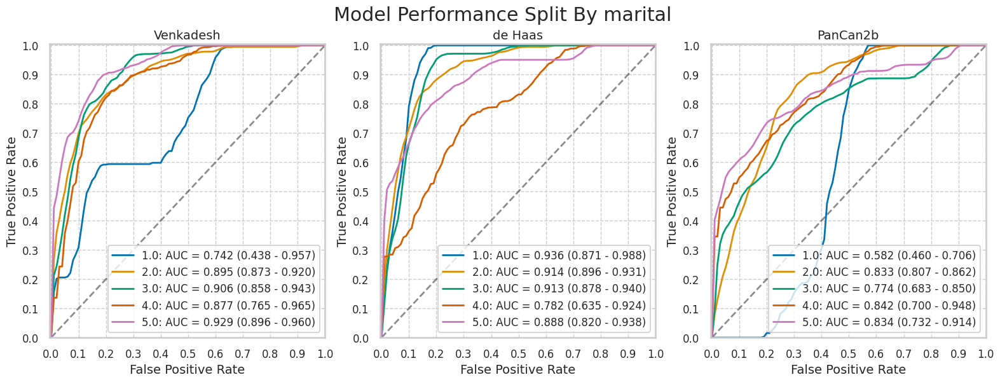

educat


,num,pct,num_mal,pct_mal
1.0,75,2.339364,7,9.333333
2.0,218,6.799750,13,5.963303
3.0,801,24.984404,80,9.987516
4.0,443,13.817842,35,7.900677
5.0,680,21.210231,67,9.852941
6.0,532,16.593886,42,7.894737
7.0,457,14.254523,32,7.002188


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,75,5,28,40,2,0.714286,0.411765,0.285714,0.588235,0.151515,0.952381,0.848485,0.047619,0.600000
2.0,218,12,69,136,1,0.923077,0.336585,0.076923,0.663415,0.148148,0.992701,0.851852,0.007299,0.678899
3.0,801,75,290,431,5,0.937500,0.402219,0.062500,0.597781,0.205479,0.988532,0.794521,0.011468,0.631710
4.0,443,33,153,255,2,0.942857,0.375000,0.057143,0.625000,0.177419,0.992218,0.822581,0.007782,0.650113
5.0,680,61,204,409,6,0.910448,0.332790,0.089552,0.667210,0.230189,0.985542,0.769811,0.014458,0.691176
6.0,532,40,145,345,2,0.952381,0.295918,0.047619,0.704082,0.216216,0.994236,0.783784,0.005764,0.723684
7.0,457,29,162,263,3,0.906250,0.381176,0.093750,0.618824,0.151832,0.988722,0.848168,0.011278,0.638950


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,75,7,32,36,0,1.000000,0.470588,0.000000,0.529412,0.179487,1.000000,0.820513,0.000000,0.573333
2.0,218,13,77,128,0,1.000000,0.375610,0.000000,0.624390,0.144444,1.000000,0.855556,0.000000,0.646789
3.0,801,78,349,372,2,0.975000,0.484050,0.025000,0.515950,0.182670,0.994652,0.817330,0.005348,0.561798
4.0,443,33,183,225,2,0.942857,0.448529,0.057143,0.551471,0.152778,0.991189,0.847222,0.008811,0.582393
5.0,680,64,242,371,3,0.955224,0.394780,0.044776,0.605220,0.209150,0.991979,0.790850,0.008021,0.639706
6.0,532,39,209,281,3,0.928571,0.426531,0.071429,0.573469,0.157258,0.989437,0.842742,0.010563,0.601504
7.0,457,32,212,213,0,1.000000,0.498824,0.000000,0.501176,0.131148,1.000000,0.868852,0.000000,0.536105


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,75,7,36,32,0,1.000000,0.529412,0.000000,0.470588,0.162791,1.000000,0.837209,0.000000,0.520000
2.0,218,11,87,118,2,0.846154,0.424390,0.153846,0.575610,0.112245,0.983333,0.887755,0.016667,0.591743
3.0,801,74,330,391,6,0.925000,0.457698,0.075000,0.542302,0.183168,0.984887,0.816832,0.015113,0.580524
4.0,443,30,222,186,5,0.857143,0.544118,0.142857,0.455882,0.119048,0.973822,0.880952,0.026178,0.487585
5.0,680,59,254,359,8,0.880597,0.414356,0.119403,0.585644,0.188498,0.978202,0.811502,0.021798,0.614706
6.0,532,40,184,306,2,0.952381,0.375510,0.047619,0.624490,0.178571,0.993506,0.821429,0.006494,0.650376
7.0,457,28,187,238,4,0.875000,0.440000,0.125000,0.560000,0.130233,0.983471,0.869767,0.016529,0.582057


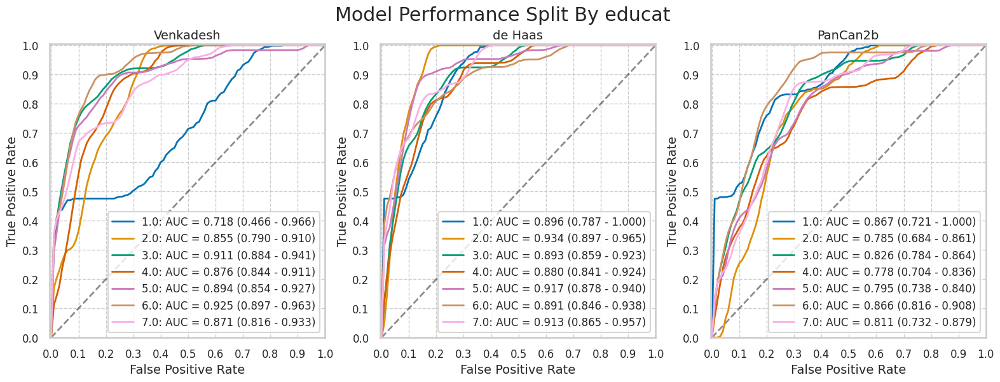

race


,num,pct,num_mal,pct_mal
1.0,3028,93.543404,253,8.355350
2.0,110,3.398208,13,11.818182
3.0,35,1.081248,3,8.571429
4.0,20,0.617856,8,40.000000
5.0,9,0.278035,1,11.111111
6.0,35,1.081248,3,8.571429


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,3028,236,976,1799,17,0.932806,0.351712,0.067194,0.648288,0.194719,0.990639,0.805281,0.009361,0.672061
2.0,110,9,36,61,4,0.692308,0.371134,0.307692,0.628866,0.200000,0.938462,0.800000,0.061538,0.636364
3.0,35,3,22,10,0,1.000000,0.687500,0.000000,0.312500,0.120000,1.000000,0.880000,0.000000,0.371429
4.0,20,8,7,5,0,1.000000,0.583333,0.000000,0.416667,0.533333,1.000000,0.466667,0.000000,0.650000
5.0,9,1,4,4,0,1.000000,0.500000,0.000000,0.500000,0.200000,1.000000,0.800000,0.000000,0.555556
6.0,35,3,19,13,0,1.000000,0.593750,0.000000,0.406250,0.136364,1.000000,0.863636,0.000000,0.457143


de Haas


/mnt/c/Users/shaur/github/thesis-repo-xps/utils.py:112: RuntimeWarning: invalid value encountered in scalar divide
  "npv": tn / (tn + fn), ## negative predictive value
/mnt/c/Users/shaur/github/thesis-repo-xps/utils.py:114: RuntimeWarning: invalid value encountered in scalar divide
  "for": fn / (fn + tn), ## False omission rate,


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,3028,244,1225,1550,9,0.964427,0.441441,0.035573,0.558559,0.166099,0.994227,0.833901,0.005773,0.592470
2.0,110,13,53,44,0,1.000000,0.546392,0.000000,0.453608,0.196970,1.000000,0.803030,0.000000,0.518182
3.0,35,3,14,18,0,1.000000,0.437500,0.000000,0.562500,0.176471,1.000000,0.823529,0.000000,0.600000
4.0,20,7,7,5,1,0.875000,0.583333,0.125000,0.416667,0.500000,0.833333,0.500000,0.166667,0.600000
5.0,9,1,8,0,0,1.000000,1.000000,0.000000,0.000000,0.111111,NaN,0.888889,NaN,0.111111
6.0,35,3,10,22,0,1.000000,0.312500,0.000000,0.687500,0.230769,1.000000,0.769231,0.000000,0.714286


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,3028,230,1223,1552,23,0.909091,0.440721,0.090909,0.559279,0.158293,0.985397,0.841707,0.014603,0.588507
2.0,110,10,46,51,3,0.769231,0.474227,0.230769,0.525773,0.178571,0.944444,0.821429,0.055556,0.554545
3.0,35,2,20,12,1,0.666667,0.625000,0.333333,0.375000,0.090909,0.923077,0.909091,0.076923,0.400000
4.0,20,7,8,4,1,0.875000,0.666667,0.125000,0.333333,0.466667,0.800000,0.533333,0.200000,0.550000
5.0,9,1,4,4,0,1.000000,0.500000,0.000000,0.500000,0.200000,1.000000,0.800000,0.000000,0.555556
6.0,35,3,14,18,0,1.000000,0.437500,0.000000,0.562500,0.176471,1.000000,0.823529,0.000000,0.600000


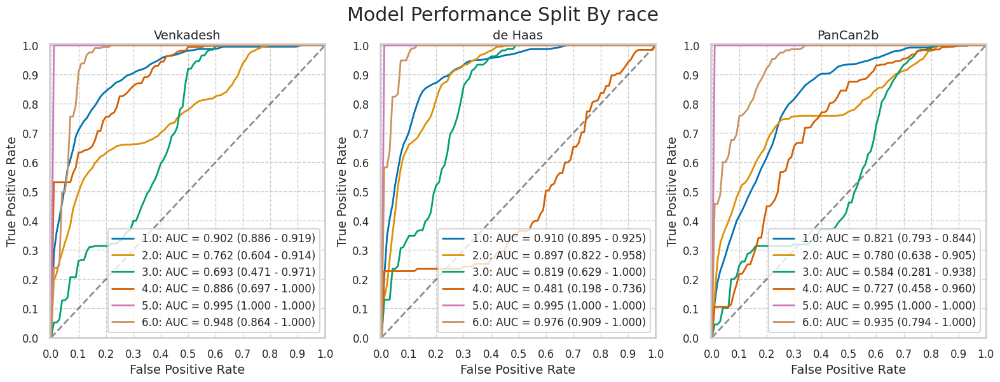

ethnic


,num,pct,num_mal,pct_mal
1.0,27,0.83669,3,11.111111
2.0,3200,99.16331,274,8.562500


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,27,3,12,12,0,1.000000,0.500000,0.000000,0.500000,0.200000,1.000000,0.800000,0.000000,0.555556
2.0,3200,253,1045,1881,21,0.923358,0.357143,0.076642,0.642857,0.194915,0.988959,0.805085,0.011041,0.666875


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,27,3,18,6,0,1.000000,0.750000,0.000000,0.250000,0.142857,1.000000,0.857143,0.000000,0.333333
2.0,3200,264,1297,1629,10,0.963504,0.443267,0.036496,0.556733,0.169122,0.993899,0.830878,0.006101,0.591562


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,27,3,12,12,0,1.00000,0.500000,0.00000,0.500000,0.20000,1.000000,0.80000,0.000000,0.555556
2.0,3200,246,1300,1626,28,0.89781,0.444293,0.10219,0.555707,0.15912,0.983071,0.84088,0.016929,0.585000


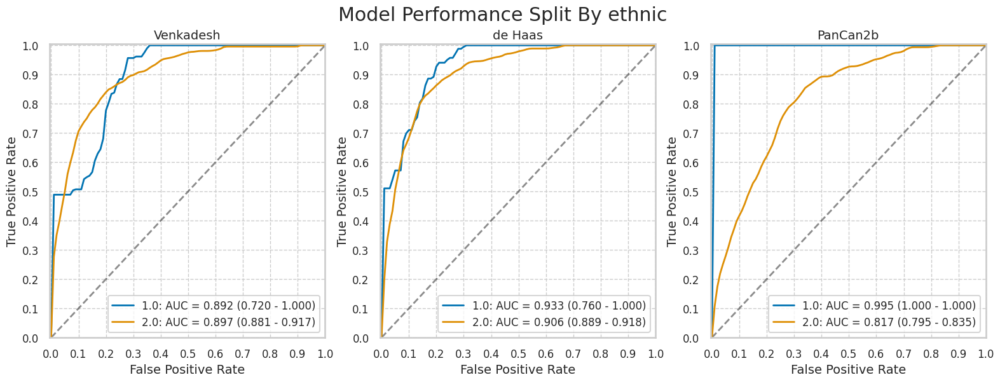

Gender


,num,pct,num_mal,pct_mal
1,1844,56.91358,179,9.707158
2,1396,43.08642,102,7.306590


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1844,171,577,1088,8,0.955307,0.346547,0.044693,0.653453,0.228610,0.992701,0.771390,0.007299,0.682755
2,1396,89,488,806,13,0.872549,0.377125,0.127451,0.622875,0.154246,0.984127,0.845754,0.015873,0.641117


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1844,175,672,993,4,0.977654,0.403604,0.022346,0.596396,0.206612,0.995988,0.793388,0.004012,0.633406
2,1396,96,648,646,6,0.941176,0.500773,0.058824,0.499227,0.129032,0.990798,0.870968,0.009202,0.531519


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1844,164,614,1051,15,0.916201,0.368769,0.083799,0.631231,0.210797,0.985929,0.789203,0.014071,0.658894
2,1396,89,704,590,13,0.872549,0.544049,0.127451,0.455951,0.112232,0.978441,0.887768,0.021559,0.486390


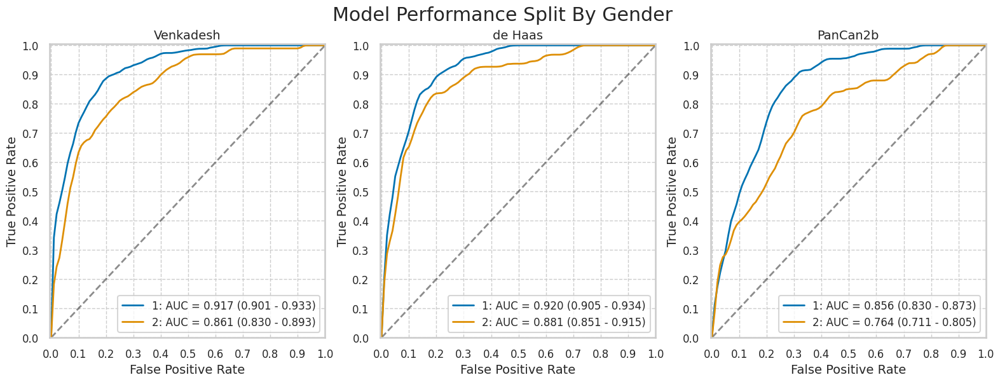

In [10]:
for cat in nlst_democols['cat']['demo']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Smoking

cigar


,num,pct,num_mal,pct_mal
0.0,2657,82.336535,230,8.656379
1.0,570,17.663465,50,8.771930


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2657,212,905,1522,18,0.921739,0.372888,0.078261,0.627112,0.189794,0.988312,0.810206,0.011688,0.652616
1.0,570,47,159,361,3,0.940000,0.305769,0.060000,0.694231,0.228155,0.991758,0.771845,0.008242,0.715789


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2657,223,1119,1308,7,0.969565,0.461063,0.030435,0.538937,0.166170,0.994677,0.833830,0.005323,0.576214
1.0,570,47,199,321,3,0.940000,0.382692,0.060000,0.617308,0.191057,0.990741,0.808943,0.009259,0.645614


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2657,204,1128,1299,26,0.886957,0.464771,0.113043,0.535229,0.153153,0.980377,0.846847,0.019623,0.565676
1.0,570,48,188,332,2,0.960000,0.361538,0.040000,0.638462,0.203390,0.994012,0.796610,0.005988,0.666667


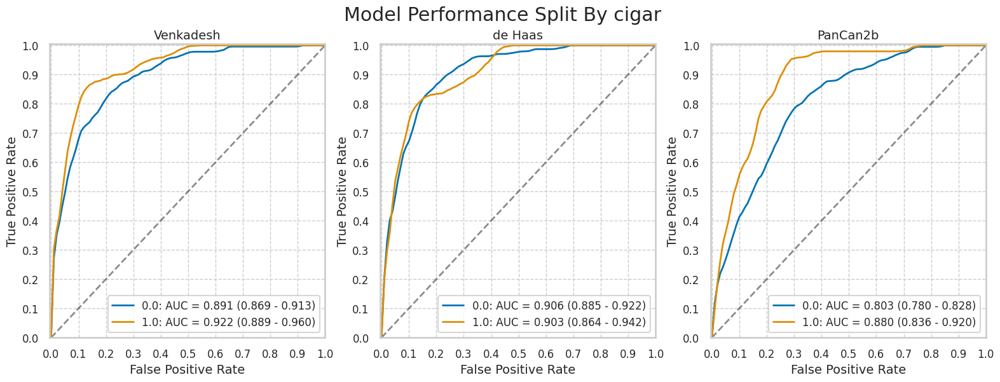

cigsmok


,num,pct,num_mal,pct_mal
0,1592,49.135802,102,6.407035
1,1648,50.864198,179,10.861650


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,1592,97,537,953,5,0.950980,0.360403,0.049020,0.639597,0.152997,0.994781,0.847003,0.005219,0.659548
1,1648,163,528,941,16,0.910615,0.359428,0.089385,0.640572,0.235890,0.983281,0.764110,0.016719,0.669903


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,1592,97,608,882,5,0.950980,0.408054,0.049020,0.591946,0.137589,0.994363,0.862411,0.005637,0.614950
1,1648,174,712,757,5,0.972067,0.484683,0.027933,0.515317,0.196388,0.993438,0.803612,0.006562,0.564927


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,1592,95,668,822,7,0.931373,0.448322,0.068627,0.551678,0.124509,0.991556,0.875491,0.008444,0.576005
1,1648,158,650,819,21,0.882682,0.442478,0.117318,0.557522,0.195545,0.975000,0.804455,0.025000,0.592840


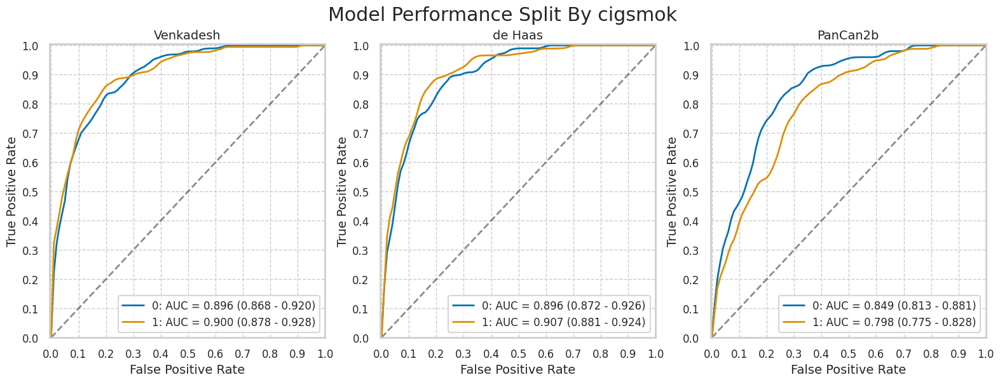

pipe


,num,pct,num_mal,pct_mal
0.0,2519,78.205526,206,8.177848
1.0,702,21.794474,74,10.541311


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2519,186,859,1454,20,0.902913,0.371379,0.097087,0.628621,0.177990,0.986431,0.822010,0.013569,0.651052
1.0,702,73,199,429,1,0.986486,0.316879,0.013514,0.683121,0.268382,0.997674,0.731618,0.002326,0.715100


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2519,198,1074,1239,8,0.961165,0.464332,0.038835,0.535668,0.155660,0.993585,0.844340,0.006415,0.570464
1.0,702,72,238,390,2,0.972973,0.378981,0.027027,0.621019,0.232258,0.994898,0.767742,0.005102,0.658120


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2519,185,1082,1231,21,0.898058,0.467791,0.101942,0.532209,0.146014,0.983227,0.853986,0.016773,0.562128
1.0,702,67,230,398,7,0.905405,0.366242,0.094595,0.633758,0.225589,0.982716,0.774411,0.017284,0.662393


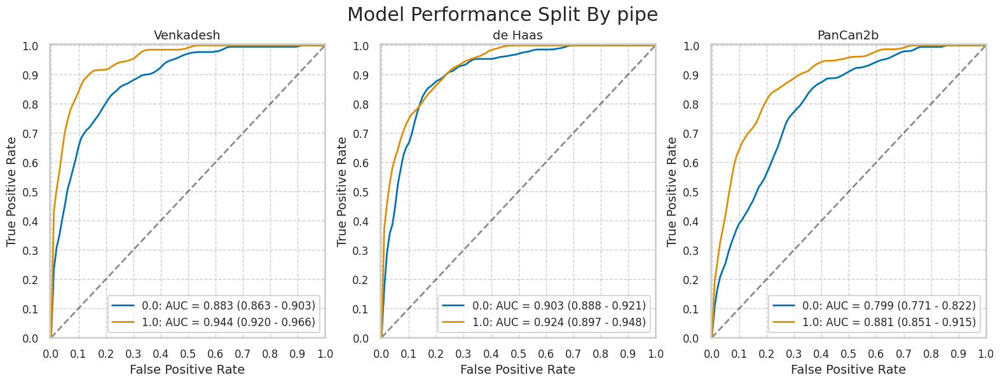

smokelive


,num,pct,num_mal,pct_mal
0.0,441,13.67018,27,6.122449
1.0,2785,86.32982,253,9.084381


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,441,25,127,287,2,0.925926,0.306763,0.074074,0.693237,0.164474,0.993080,0.835526,0.006920,0.707483
1.0,2785,234,936,1596,19,0.924901,0.369668,0.075099,0.630332,0.200000,0.988235,0.800000,0.011765,0.657092


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,441,26,169,245,1,0.962963,0.408213,0.037037,0.591787,0.133333,0.995935,0.866667,0.004065,0.614512
1.0,2785,244,1149,1383,9,0.964427,0.453791,0.035573,0.546209,0.175162,0.993534,0.824838,0.006466,0.584201


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,441,26,161,253,1,0.962963,0.388889,0.037037,0.611111,0.139037,0.996063,0.860963,0.003937,0.632653
1.0,2785,226,1154,1378,27,0.893281,0.455766,0.106719,0.544234,0.163768,0.980783,0.836232,0.019217,0.575943


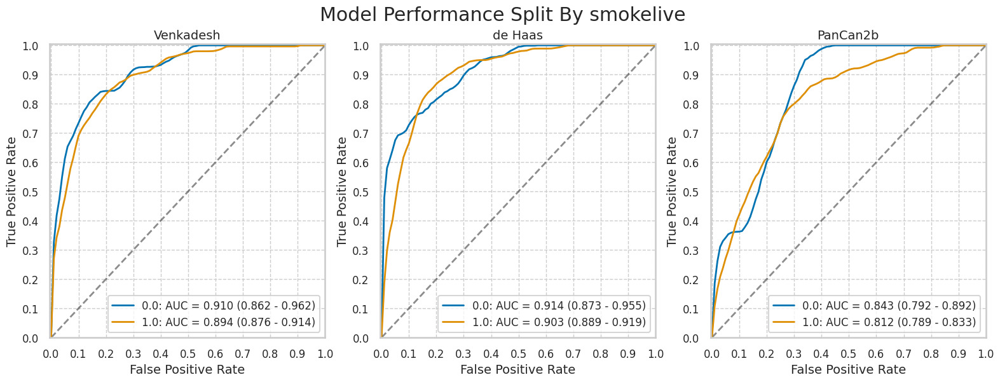

smokework


,num,pct,num_mal,pct_mal
0.0,416,12.939347,34,8.173077
1.0,2799,87.060653,247,8.824580


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,416,32,149,233,2,0.941176,0.390052,0.058824,0.609948,0.176796,0.991489,0.823204,0.008511,0.637019
1.0,2799,228,911,1641,19,0.923077,0.356975,0.076923,0.643025,0.200176,0.988554,0.799824,0.011446,0.667738


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,416,33,157,225,1,0.970588,0.410995,0.029412,0.589005,0.173684,0.995575,0.826316,0.004425,0.620192
1.0,2799,238,1158,1394,9,0.963563,0.453762,0.036437,0.546238,0.170487,0.993585,0.829513,0.006415,0.583065


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,416,27,187,195,7,0.794118,0.489529,0.205882,0.510471,0.126168,0.965347,0.873832,0.034653,0.533654
1.0,2799,226,1120,1432,21,0.914980,0.438871,0.085020,0.561129,0.167905,0.985547,0.832095,0.014453,0.592354


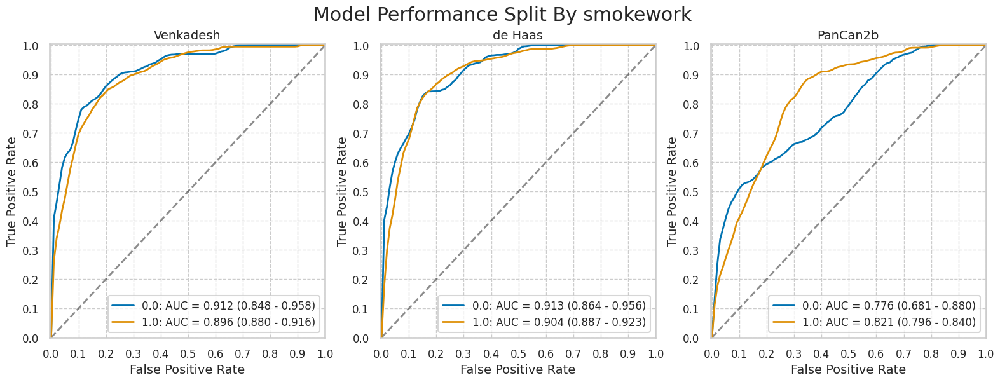

In [11]:
for cat in nlst_democols['cat']['smoke']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Work history

wrkasbe


,num,pct,num_mal,pct_mal
0.0,2980,92.003705,265,8.892617
1.0,259,7.996295,16,6.177606


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2980,244,965,1750,21,0.920755,0.355433,0.079245,0.644567,0.201820,0.988142,0.798180,0.011858,0.669128
1.0,259,16,100,143,0,1.000000,0.411523,0.000000,0.588477,0.137931,1.000000,0.862069,0.000000,0.613900


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2980,256,1219,1496,9,0.966038,0.448987,0.033962,0.551013,0.173559,0.994020,0.826441,0.005980,0.587919
1.0,259,15,101,142,1,0.937500,0.415638,0.062500,0.584362,0.129310,0.993007,0.870690,0.006993,0.606178


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2980,238,1210,1505,27,0.898113,0.445672,0.101887,0.554328,0.164365,0.982376,0.835635,0.017624,0.584899
1.0,259,15,107,136,1,0.937500,0.440329,0.062500,0.559671,0.122951,0.992701,0.877049,0.007299,0.583012


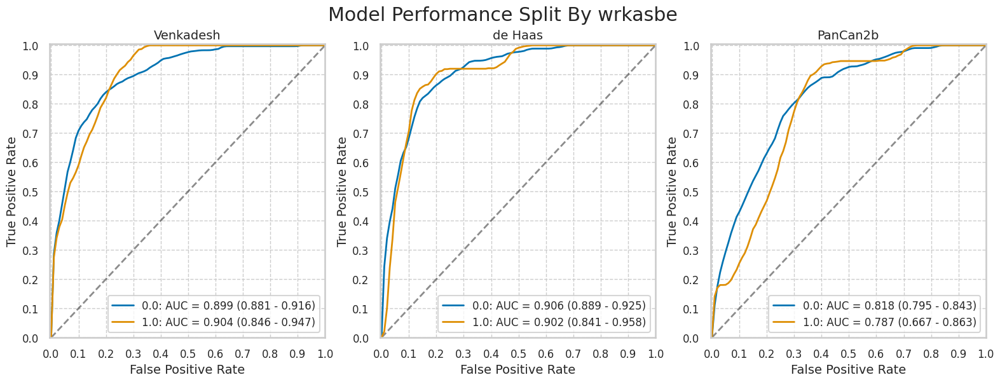

wrkbaki


,num,pct,num_mal,pct_mal
0.0,3179,98.117284,278,8.744888
1.0,61,1.882716,3,4.918033


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3179,259,1052,1849,19,0.931655,0.362634,0.068345,0.637366,0.197559,0.989829,0.802441,0.010171,0.663102
1.0,61,1,13,45,2,0.333333,0.224138,0.666667,0.775862,0.071429,0.957447,0.928571,0.042553,0.754098


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3179,268,1293,1608,10,0.964029,0.445708,0.035971,0.554292,0.171685,0.99382,0.828315,0.00618,0.590123
1.0,61,3,27,31,0,1.000000,0.465517,0.000000,0.534483,0.100000,1.00000,0.900000,0.00000,0.557377


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3179,250,1290,1611,28,0.899281,0.444674,0.100719,0.555326,0.162338,0.982916,0.837662,0.017084,0.585404
1.0,61,3,28,30,0,1.000000,0.482759,0.000000,0.517241,0.096774,1.000000,0.903226,0.000000,0.540984


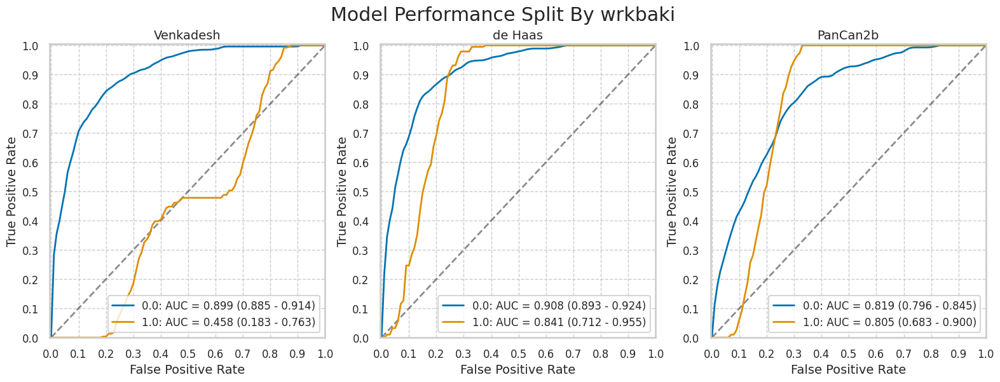

wrkbutc


,num,pct,num_mal,pct_mal
0.0,3201,98.796296,271,8.466104
1.0,39,1.203704,10,25.641026


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3201,250,1048,1882,21,0.922509,0.357679,0.077491,0.642321,0.192604,0.988965,0.807396,0.011035,0.666042
1.0,39,10,17,12,0,1.000000,0.586207,0.000000,0.413793,0.370370,1.000000,0.629630,0.000000,0.564103


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3201,261,1305,1625,10,0.9631,0.445392,0.0369,0.554608,0.166667,0.993884,0.833333,0.006116,0.589191
1.0,39,10,15,14,0,1.0000,0.517241,0.0000,0.482759,0.400000,1.000000,0.600000,0.000000,0.615385


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3201,243,1302,1628,28,0.896679,0.444369,0.103321,0.555631,0.157282,0.983092,0.842718,0.016908,0.584505
1.0,39,10,16,13,0,1.000000,0.551724,0.000000,0.448276,0.384615,1.000000,0.615385,0.000000,0.589744


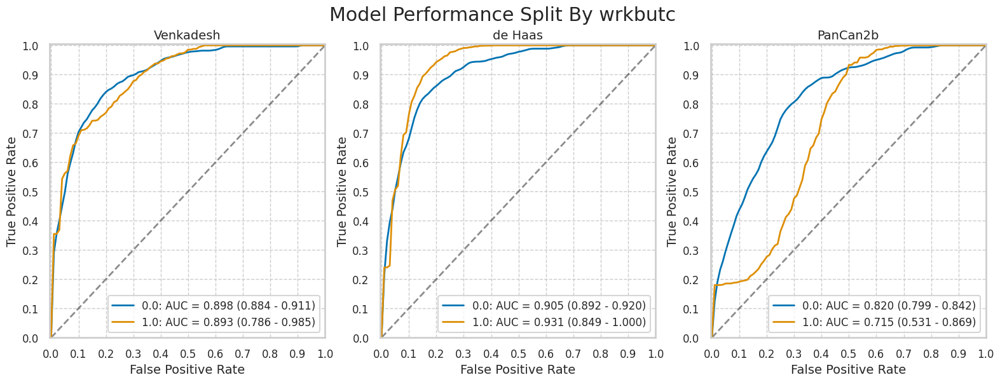

wrkchem


,num,pct,num_mal,pct_mal
0.0,3000,92.764378,268,8.933333
1.0,234,7.235622,13,5.555556


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3000,247,973,1759,21,0.921642,0.356149,0.078358,0.643851,0.202459,0.988202,0.797541,0.011798,0.668667
1.0,234,13,91,130,0,1.000000,0.411765,0.000000,0.588235,0.125000,1.000000,0.875000,0.000000,0.611111


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3000,258,1231,1501,10,0.962687,0.450586,0.037313,0.549414,0.173271,0.993382,0.826729,0.006618,0.586333
1.0,234,13,86,135,0,1.000000,0.389140,0.000000,0.610860,0.131313,1.000000,0.868687,0.000000,0.632479


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3000,241,1223,1509,27,0.899254,0.447657,0.100746,0.552343,0.164617,0.982422,0.835383,0.017578,0.583333
1.0,234,12,91,130,1,0.923077,0.411765,0.076923,0.588235,0.116505,0.992366,0.883495,0.007634,0.606838


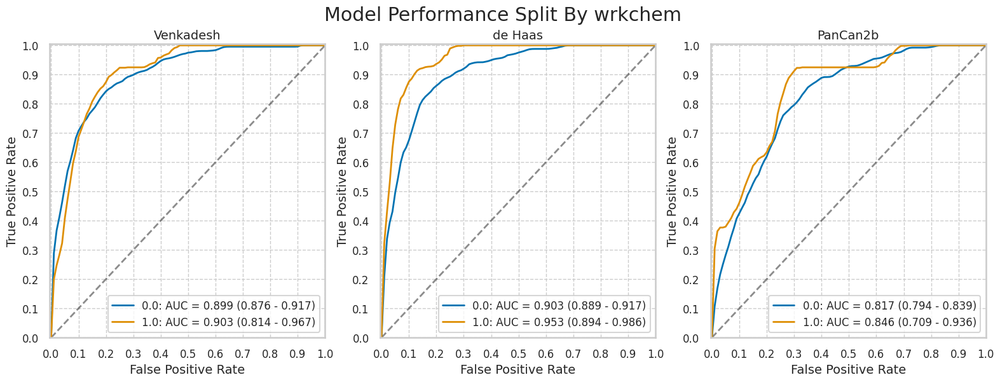

wrkcoal


,num,pct,num_mal,pct_mal
0.0,3213,99.166667,280,8.714597
1.0,27,0.833333,1,3.703704


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3213,259,1043,1890,21,0.925,0.355609,0.075,0.644391,0.198925,0.989011,0.801075,0.010989,0.668845
1.0,27,1,22,4,0,1.000,0.846154,0.000,0.153846,0.043478,1.000000,0.956522,0.000000,0.185185


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3213,270,1312,1621,10,0.964286,0.447324,0.035714,0.552676,0.170670,0.993869,0.829330,0.006131,0.588547
1.0,27,1,8,18,0,1.000000,0.307692,0.000000,0.692308,0.111111,1.000000,0.888889,0.000000,0.703704


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3213,252,1305,1628,28,0.9,0.444937,0.1,0.555063,0.161850,0.983092,0.838150,0.016908,0.585123
1.0,27,1,13,13,0,1.0,0.500000,0.0,0.500000,0.071429,1.000000,0.928571,0.000000,0.518519


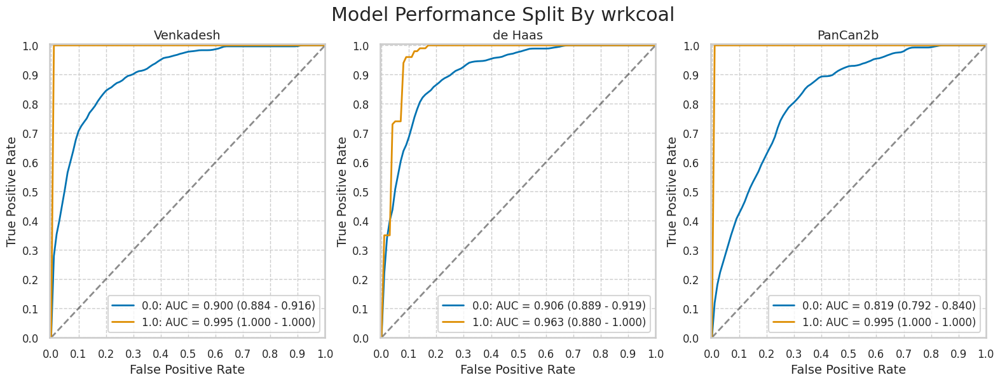

wrkcott


,num,pct,num_mal,pct_mal
0.0,3220,99.382716,275,8.540373
1.0,20,0.617284,6,30.000000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3220,254,1058,1887,21,0.923636,0.359253,0.076364,0.640747,0.193598,0.988994,0.806402,0.011006,0.664907
1.0,20,6,7,7,0,1.000000,0.500000,0.000000,0.500000,0.461538,1.000000,0.538462,0.000000,0.650000


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3220,265,1313,1632,10,0.963636,0.44584,0.036364,0.55416,0.167934,0.99391,0.832066,0.00609,0.58913
1.0,20,6,7,7,0,1.000000,0.50000,0.000000,0.50000,0.461538,1.00000,0.538462,0.00000,0.65000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3220,248,1309,1636,27,0.901818,0.444482,0.098182,0.555518,0.159281,0.983764,0.840719,0.016236,0.585093
1.0,20,5,9,5,1,0.833333,0.642857,0.166667,0.357143,0.357143,0.833333,0.642857,0.166667,0.500000


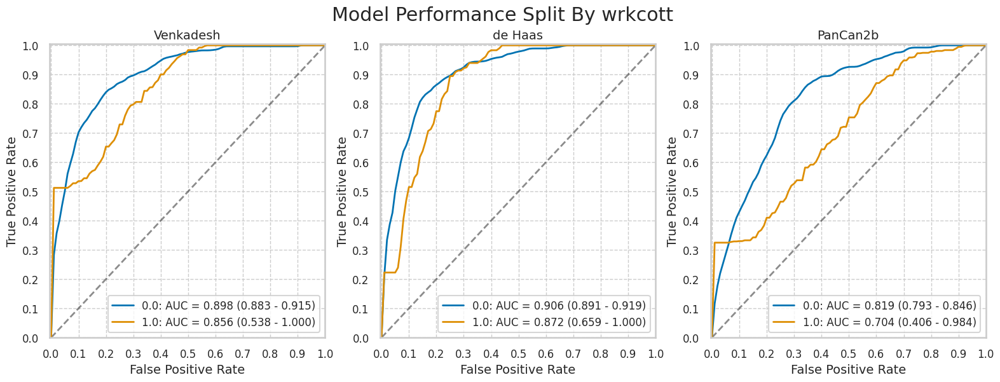

wrkfarm


,num,pct,num_mal,pct_mal
0.0,2841,87.685185,250,8.799718
1.0,399,12.314815,31,7.769424


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2841,232,941,1650,18,0.928000,0.363180,0.072000,0.636820,0.197783,0.989209,0.802217,0.010791,0.662443
1.0,399,28,124,244,3,0.903226,0.336957,0.096774,0.663043,0.184211,0.987854,0.815789,0.012146,0.681704


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2841,241,1200,1391,9,0.964000,0.463142,0.036000,0.536858,0.167245,0.993571,0.832755,0.006429,0.574446
1.0,399,30,120,248,1,0.967742,0.326087,0.032258,0.673913,0.200000,0.995984,0.800000,0.004016,0.696742


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2841,223,1167,1424,27,0.892000,0.450405,0.108000,0.549595,0.160432,0.981392,0.839568,0.018608,0.579725
1.0,399,30,151,217,1,0.967742,0.410326,0.032258,0.589674,0.165746,0.995413,0.834254,0.004587,0.619048


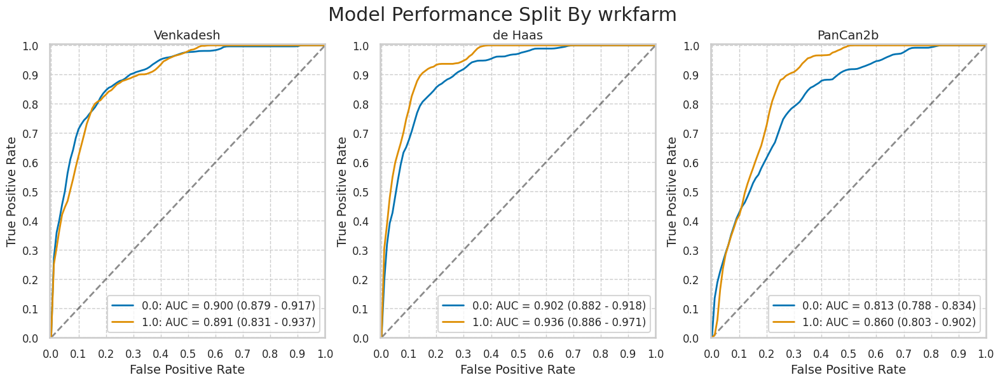

wrkfire


,num,pct,num_mal,pct_mal
0.0,3192,98.518519,275,8.615288
1.0,48,1.481481,6,12.500000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3192,254,1056,1861,21,0.923636,0.362016,0.076364,0.637984,0.193893,0.988842,0.806107,0.011158,0.662594
1.0,48,6,9,33,0,1.000000,0.214286,0.000000,0.785714,0.400000,1.000000,0.600000,0.000000,0.812500


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3192,265,1307,1610,10,0.963636,0.448063,0.036364,0.551937,0.168575,0.993827,0.831425,0.006173,0.587406
1.0,48,6,13,29,0,1.000000,0.309524,0.000000,0.690476,0.315789,1.000000,0.684211,0.000000,0.729167


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3192,247,1305,1612,28,0.898182,0.447377,0.101818,0.552623,0.159149,0.982927,0.840851,0.017073,0.582393
1.0,48,6,13,29,0,1.000000,0.309524,0.000000,0.690476,0.315789,1.000000,0.684211,0.000000,0.729167


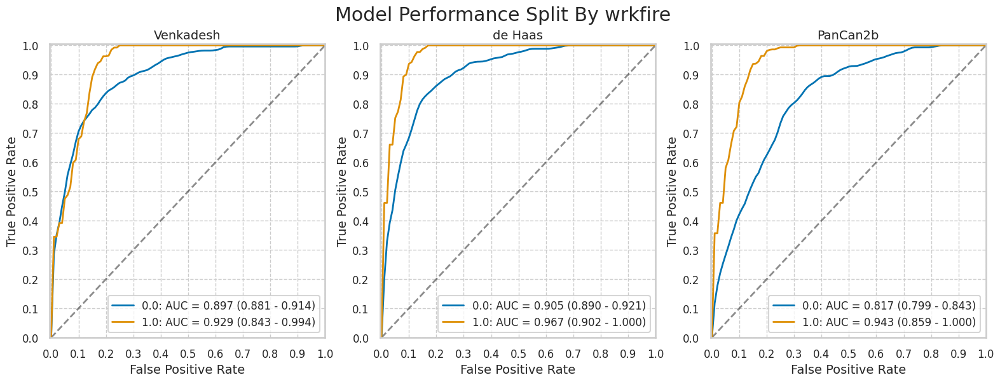

wrkflou


,num,pct,num_mal,pct_mal
0.0,3190,98.45679,278,8.714734
1.0,50,1.54321,3,6.000000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3190,257,1051,1861,21,0.92446,0.360920,0.07554,0.639080,0.196483,0.988842,0.803517,0.011158,0.66395
1.0,50,3,14,33,0,1.00000,0.297872,0.00000,0.702128,0.176471,1.000000,0.823529,0.000000,0.72000


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3190,269,1306,1606,9,0.967626,0.448489,0.032374,0.551511,0.170794,0.994427,0.829206,0.005573,0.587774
1.0,50,2,14,33,1,0.666667,0.297872,0.333333,0.702128,0.125000,0.970588,0.875000,0.029412,0.700000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3190,250,1295,1617,28,0.899281,0.444712,0.100719,0.555288,0.161812,0.982979,0.838188,0.017021,0.585266
1.0,50,3,23,24,0,1.000000,0.489362,0.000000,0.510638,0.115385,1.000000,0.884615,0.000000,0.540000


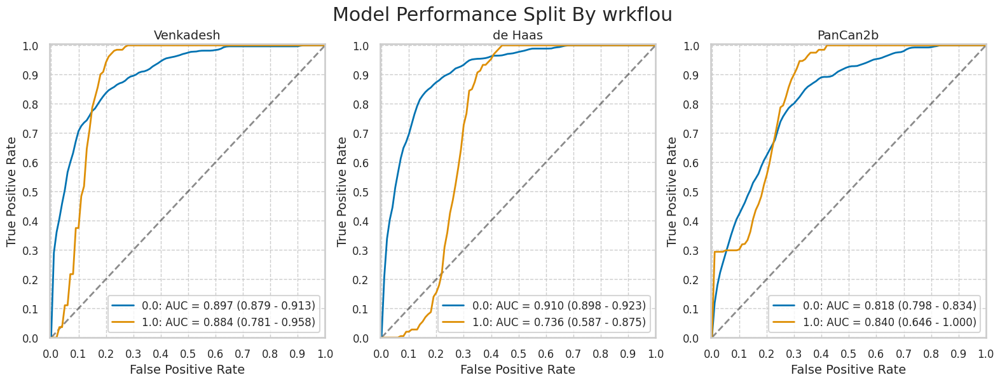

wrkfoun


,num,pct,num_mal,pct_mal
0.0,3112,96.049383,258,8.290488
1.0,128,3.950617,23,17.968750


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3112,242,1021,1833,16,0.937984,0.357744,0.062016,0.642256,0.191607,0.991347,0.808393,0.008653,0.666774
1.0,128,18,44,61,5,0.782609,0.419048,0.217391,0.580952,0.290323,0.924242,0.709677,0.075758,0.617188


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3112,249,1270,1584,9,0.965116,0.444989,0.034884,0.555011,0.163924,0.994350,0.836076,0.005650,0.589010
1.0,128,22,50,55,1,0.956522,0.476190,0.043478,0.523810,0.305556,0.982143,0.694444,0.017857,0.601562


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3112,233,1266,1588,25,0.903101,0.443588,0.096899,0.556412,0.155437,0.984501,0.844563,0.015499,0.585154
1.0,128,20,52,53,3,0.869565,0.495238,0.130435,0.504762,0.277778,0.946429,0.722222,0.053571,0.570312


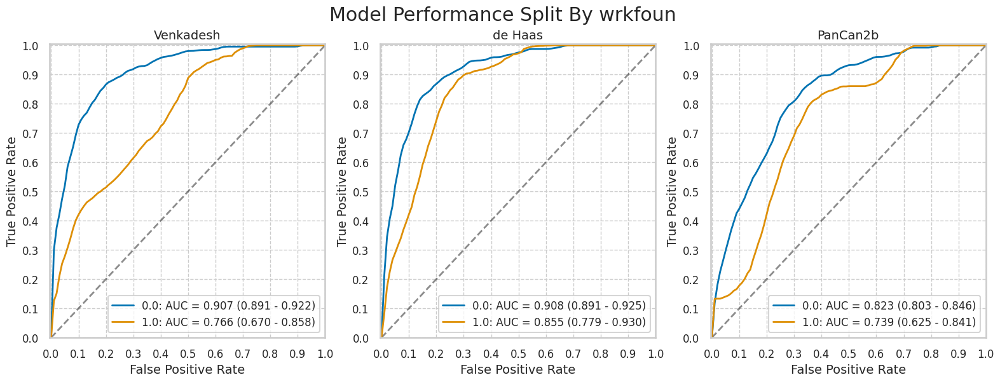

wrkhard


,num,pct,num_mal,pct_mal
0.0,3216,99.259259,281,8.737562
1.0,24,0.740741,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkpain


,num,pct,num_mal,pct_mal
0.0,3044,93.950617,261,8.574244
1.0,196,6.049383,20,10.204082


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3044,242,1001,1782,19,0.927203,0.359684,0.072797,0.640316,0.194690,0.989450,0.805310,0.010550,0.664915
1.0,196,18,64,112,2,0.900000,0.363636,0.100000,0.636364,0.219512,0.982456,0.780488,0.017544,0.663265


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3044,253,1246,1537,8,0.969349,0.447718,0.030651,0.552282,0.168779,0.994822,0.831221,0.005178,0.588042
1.0,196,18,74,102,2,0.900000,0.420455,0.100000,0.579545,0.195652,0.980769,0.804348,0.019231,0.612245


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3044,233,1250,1533,28,0.89272,0.449156,0.10728,0.550844,0.157114,0.982063,0.842886,0.017937,0.580158
1.0,196,20,68,108,0,1.00000,0.386364,0.00000,0.613636,0.227273,1.000000,0.772727,0.000000,0.653061


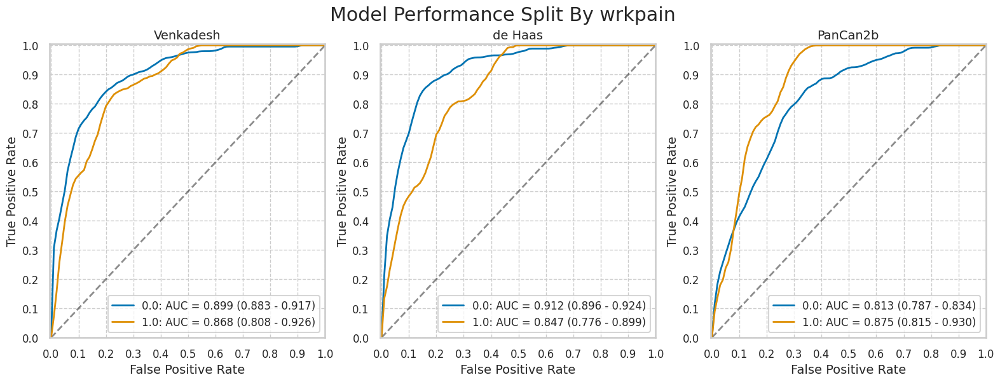

wrksand


,num,pct,num_mal,pct_mal
0.0,3171,97.87037,271,8.546200
1.0,69,2.12963,10,14.492754


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3171,250,1032,1868,21,0.922509,0.355862,0.077491,0.644138,0.195008,0.988883,0.804992,0.011117,0.667928
1.0,69,10,33,26,0,1.000000,0.559322,0.000000,0.440678,0.232558,1.000000,0.767442,0.000000,0.521739


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3171,263,1283,1617,8,0.97048,0.442414,0.02952,0.557586,0.170116,0.995077,0.829884,0.004923,0.592873
1.0,69,8,37,22,2,0.80000,0.627119,0.20000,0.372881,0.177778,0.916667,0.822222,0.083333,0.434783


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3171,243,1287,1613,28,0.896679,0.443793,0.103321,0.556207,0.158824,0.982937,0.841176,0.017063,0.585304
1.0,69,10,31,28,0,1.000000,0.525424,0.000000,0.474576,0.243902,1.000000,0.756098,0.000000,0.550725


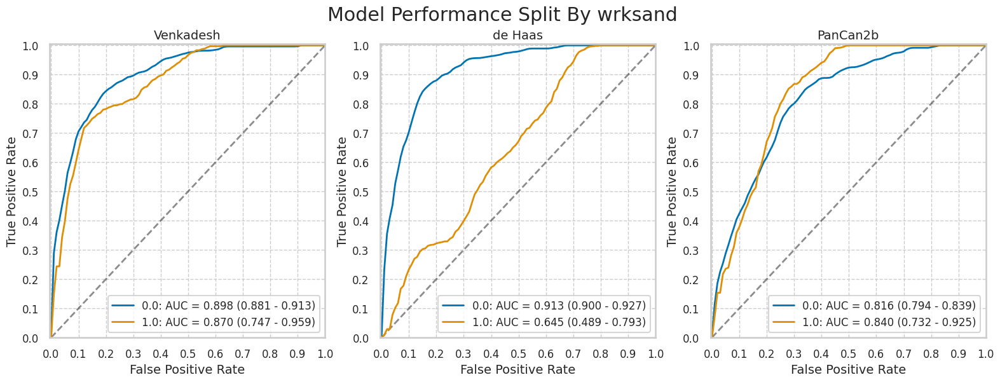

wrkweld


,num,pct,num_mal,pct_mal
0.0,3007,92.808642,250,8.313934
1.0,233,7.191358,31,13.304721


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3007,230,987,1770,20,0.920000,0.357998,0.080000,0.642002,0.188989,0.988827,0.811011,0.011173,0.665115
1.0,233,30,78,124,1,0.967742,0.386139,0.032258,0.613861,0.277778,0.992000,0.722222,0.008000,0.660944


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3007,242,1248,1509,8,0.968000,0.452666,0.032000,0.547334,0.162416,0.994726,0.837584,0.005274,0.582308
1.0,233,29,72,130,2,0.935484,0.356436,0.064516,0.643564,0.287129,0.984848,0.712871,0.015152,0.682403


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3007,225,1237,1520,25,0.900000,0.448676,0.100000,0.551324,0.153899,0.983819,0.846101,0.016181,0.580313
1.0,233,28,81,121,3,0.903226,0.400990,0.096774,0.599010,0.256881,0.975806,0.743119,0.024194,0.639485


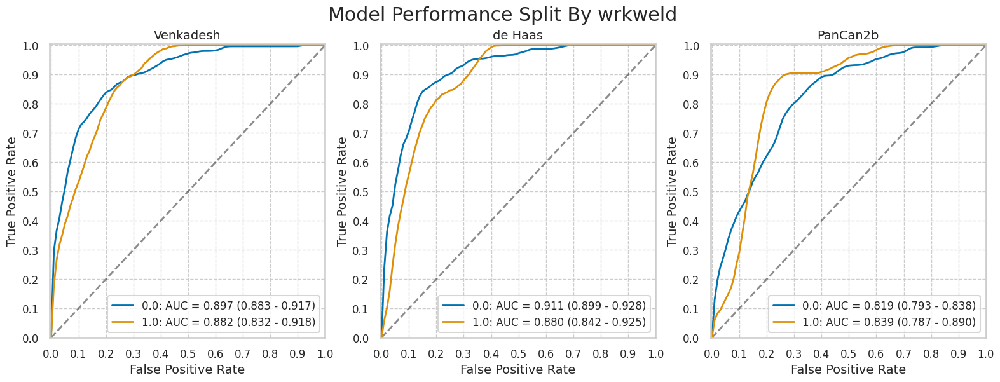

wrknomask


,num,pct,num_mal,pct_mal
False,2386,73.641975,208,8.717519
True,854,26.358025,73,8.548009


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,2386,193,793,1385,15,0.927885,0.364096,0.072115,0.635904,0.19574,0.989286,0.80426,0.010714,0.661358
True,854,67,272,509,6,0.917808,0.348271,0.082192,0.651729,0.19764,0.988350,0.80236,0.011650,0.674473


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,2386,201,1022,1156,7,0.966346,0.469238,0.033654,0.530762,0.164350,0.993981,0.835650,0.006019,0.568734
True,854,70,298,483,3,0.958904,0.381562,0.041096,0.618438,0.190217,0.993827,0.809783,0.006173,0.647541


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,2386,186,998,1180,22,0.894231,0.458219,0.105769,0.541781,0.157095,0.981697,0.842905,0.018303,0.572506
True,854,67,320,461,6,0.917808,0.409731,0.082192,0.590269,0.173127,0.987152,0.826873,0.012848,0.618267


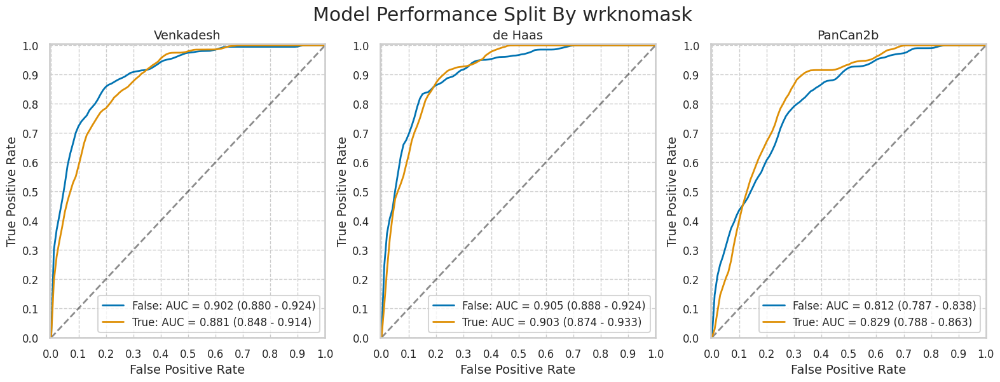

In [12]:
for cat in nlst_democols['cat']['work']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Disease history

,num,pct,num_mal,pct_mal
False,2118,65.37037,156,7.365439
True,1122,34.62963,125,11.140820


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,2118,144,680,1282,12,0.923077,0.346585,0.076923,0.653415,0.174757,0.990726,0.825243,0.009274,0.673277
True,1122,116,385,612,9,0.928000,0.386158,0.072000,0.613842,0.231537,0.985507,0.768463,0.014493,0.648841


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,2118,151,818,1144,5,0.967949,0.416922,0.032051,0.583078,0.155831,0.995648,0.844169,0.004352,0.611426
True,1122,120,502,495,5,0.960000,0.503511,0.040000,0.496489,0.192926,0.990000,0.807074,0.010000,0.548128


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,2118,139,784,1178,17,0.891026,0.399592,0.108974,0.600408,0.150596,0.985774,0.849404,0.014226,0.621813
True,1122,114,534,463,11,0.912000,0.535607,0.088000,0.464393,0.175926,0.976793,0.824074,0.023207,0.514260


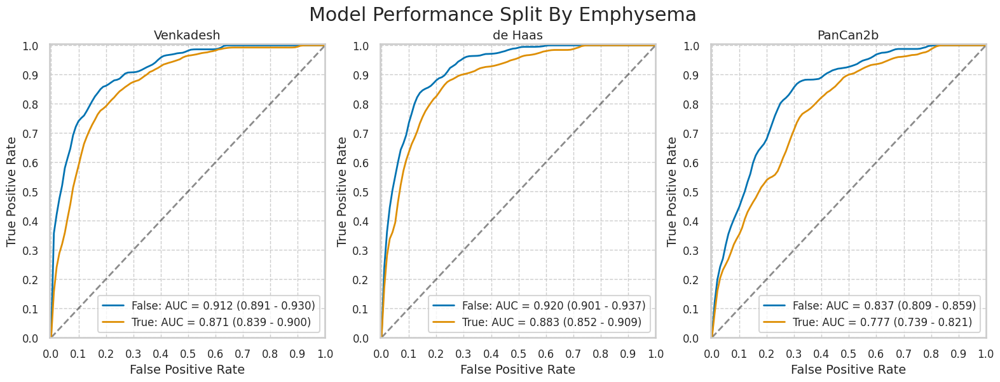

,num,pct,num_mal,pct_mal
False,2118,65.37037,156,7.365439
True,1122,34.62963,125,11.140820


In [13]:
plot_by_category(nlst_preds, 'Emphysema')

diagadas


,num,pct,num_mal,pct_mal
0.0,3032,93.695921,263,8.674142
1.0,204,6.304079,15,7.352941


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3032,245,978,1791,18,0.931559,0.353196,0.068441,0.646804,0.200327,0.990050,0.799673,0.009950,0.671504
1.0,204,12,87,102,3,0.800000,0.460317,0.200000,0.539683,0.121212,0.971429,0.878788,0.028571,0.558824


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3032,254,1216,1553,9,0.965779,0.439148,0.034221,0.560852,0.172789,0.994238,0.827211,0.005762,0.595976
1.0,204,14,103,86,1,0.933333,0.544974,0.066667,0.455026,0.119658,0.988506,0.880342,0.011494,0.490196


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3032,238,1201,1568,25,0.904943,0.433731,0.095057,0.566269,0.165393,0.984306,0.834607,0.015694,0.595646
1.0,204,12,117,72,3,0.800000,0.619048,0.200000,0.380952,0.093023,0.960000,0.906977,0.040000,0.411765


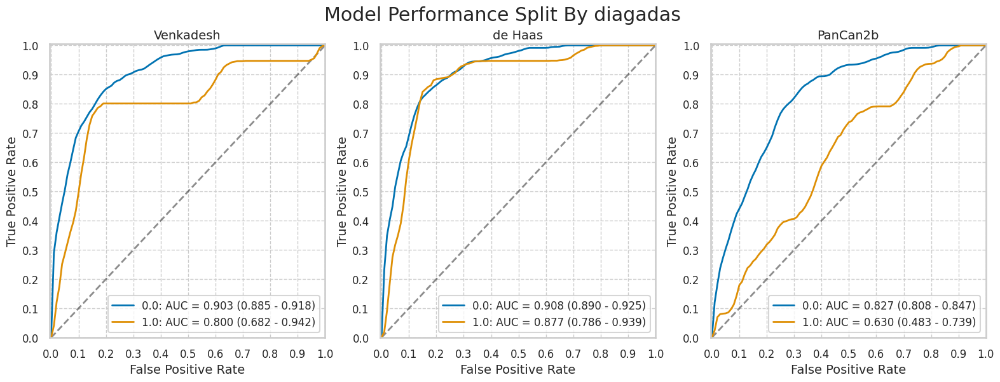

diagasbe


,num,pct,num_mal,pct_mal
0.0,3175,98.054355,281,8.850394
1.0,63,1.945645,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagbron


,num,pct,num_mal,pct_mal
0.0,3085,95.451733,274,8.881686
1.0,147,4.548267,4,2.721088


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3085,253,1024,1787,21,0.923358,0.364283,0.076642,0.635717,0.198121,0.988385,0.801879,0.011615,0.661264
1.0,147,4,38,105,0,1.000000,0.265734,0.000000,0.734266,0.095238,1.000000,0.904762,0.000000,0.741497


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3085,264,1267,1544,10,0.963504,0.450729,0.036496,0.549271,0.172436,0.993565,0.827564,0.006435,0.586062
1.0,147,4,51,92,0,1.000000,0.356643,0.000000,0.643357,0.072727,1.000000,0.927273,0.000000,0.653061


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3085,247,1256,1555,27,0.90146,0.446816,0.09854,0.553184,0.164338,0.982933,0.835662,0.017067,0.584117
1.0,147,3,60,83,1,0.75000,0.419580,0.25000,0.580420,0.047619,0.988095,0.952381,0.011905,0.585034


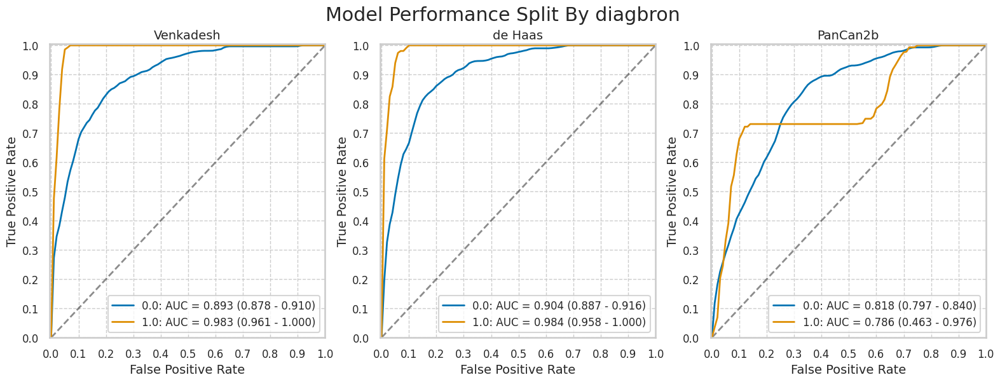

diagchas


,num,pct,num_mal,pct_mal
0.0,3108,95.955542,279,8.976834
1.0,131,4.044458,2,1.526718


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3108,258,1014,1815,21,0.924731,0.358431,0.075269,0.641569,0.202830,0.988562,0.797170,0.011438,0.666988
1.0,131,2,51,78,0,1.000000,0.395349,0.000000,0.604651,0.037736,1.000000,0.962264,0.000000,0.610687


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3108,269,1253,1576,10,0.964158,0.442913,0.035842,0.557087,0.176741,0.993695,0.823259,0.006305,0.593629
1.0,131,2,66,63,0,1.000000,0.511628,0.000000,0.488372,0.029412,1.000000,0.970588,0.000000,0.496183


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3108,251,1269,1560,28,0.899642,0.448568,0.100358,0.551432,0.165132,0.982368,0.834868,0.017632,0.582690
1.0,131,2,49,80,0,1.000000,0.379845,0.000000,0.620155,0.039216,1.000000,0.960784,0.000000,0.625954


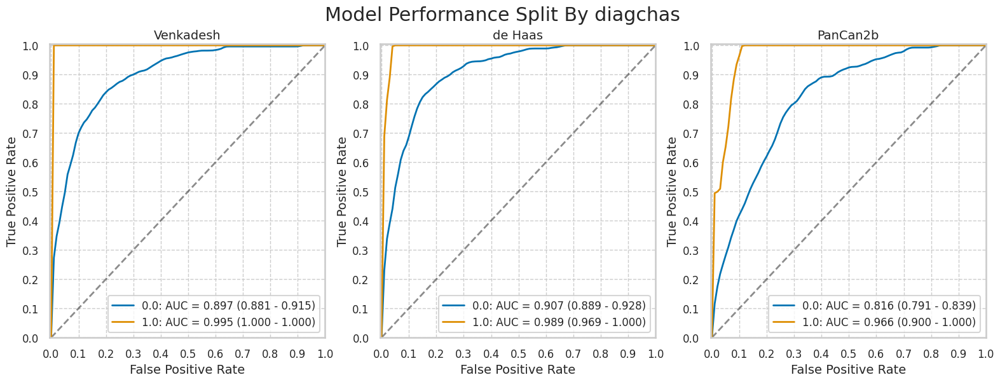

diagchro


,num,pct,num_mal,pct_mal
0.0,2869,88.741107,246,8.574416
1.0,364,11.258893,32,8.791209


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2869,228,940,1683,18,0.926829,0.358368,0.073171,0.641632,0.195205,0.989418,0.804795,0.010582,0.666086
1.0,364,29,121,211,3,0.906250,0.364458,0.093750,0.635542,0.193333,0.985981,0.806667,0.014019,0.659341


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2869,237,1171,1452,9,0.963415,0.446435,0.036585,0.553565,0.168324,0.993840,0.831676,0.006160,0.588707
1.0,364,31,146,186,1,0.968750,0.439759,0.031250,0.560241,0.175141,0.994652,0.824859,0.005348,0.596154


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2869,222,1167,1456,24,0.902439,0.444910,0.097561,0.555090,0.159827,0.983784,0.840173,0.016216,0.584873
1.0,364,28,150,182,4,0.875000,0.451807,0.125000,0.548193,0.157303,0.978495,0.842697,0.021505,0.576923


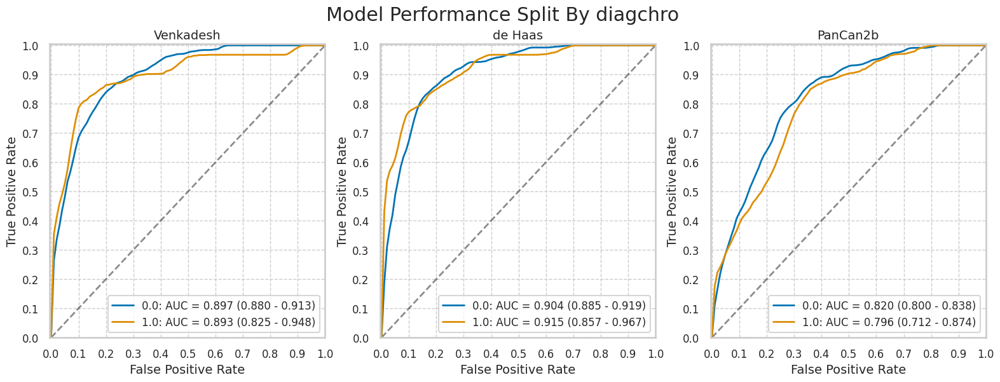

diagcopd


,num,pct,num_mal,pct_mal
0.0,3011,93.104515,259,8.601793
1.0,223,6.895485,22,9.865471


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3011,239,981,1771,20,0.922780,0.356468,0.077220,0.643532,0.195902,0.988833,0.804098,0.011167,0.667552
1.0,223,21,80,121,1,0.954545,0.398010,0.045455,0.601990,0.207921,0.991803,0.792079,0.008197,0.636771


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3011,249,1222,1530,10,0.96139,0.444041,0.03861,0.555959,0.169273,0.993506,0.830727,0.006494,0.590834
1.0,223,22,97,104,0,1.00000,0.482587,0.00000,0.517413,0.184874,1.000000,0.815126,0.000000,0.565022


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,3011,232,1197,1555,27,0.895753,0.434956,0.104247,0.565044,0.162351,0.982933,0.837649,0.017067,0.593491
1.0,223,21,117,84,1,0.954545,0.582090,0.045455,0.417910,0.152174,0.988235,0.847826,0.011765,0.470852


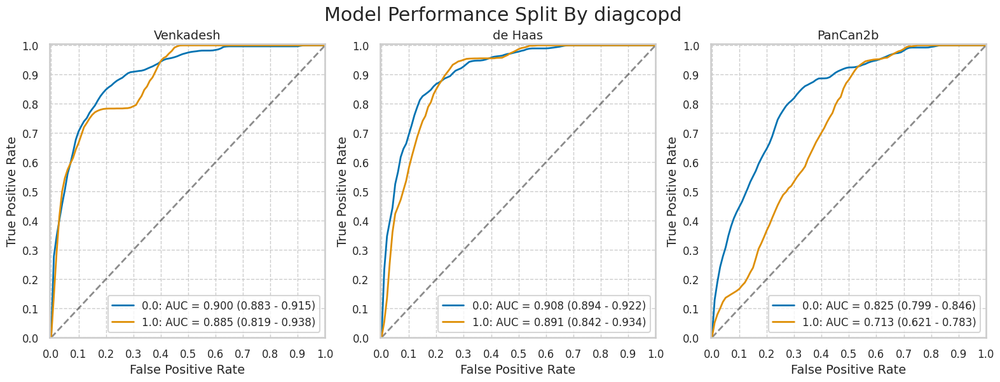

diagdiab


,num,pct,num_mal,pct_mal
0.0,2880,88.888889,256,8.888889
1.0,360,11.111111,25,6.944444


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2880,241,969,1655,15,0.941406,0.369284,0.058594,0.630716,0.199174,0.991018,0.800826,0.008982,0.658333
1.0,360,19,96,239,6,0.760000,0.286567,0.240000,0.713433,0.165217,0.975510,0.834783,0.024490,0.716667


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2880,248,1172,1452,8,0.96875,0.446646,0.03125,0.553354,0.174648,0.994521,0.825352,0.005479,0.590278
1.0,360,23,148,187,2,0.92000,0.441791,0.08000,0.558209,0.134503,0.989418,0.865497,0.010582,0.583333


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2880,231,1175,1449,25,0.902344,0.447790,0.097656,0.552210,0.164296,0.983039,0.835704,0.016961,0.583333
1.0,360,22,143,192,3,0.880000,0.426866,0.120000,0.573134,0.133333,0.984615,0.866667,0.015385,0.594444


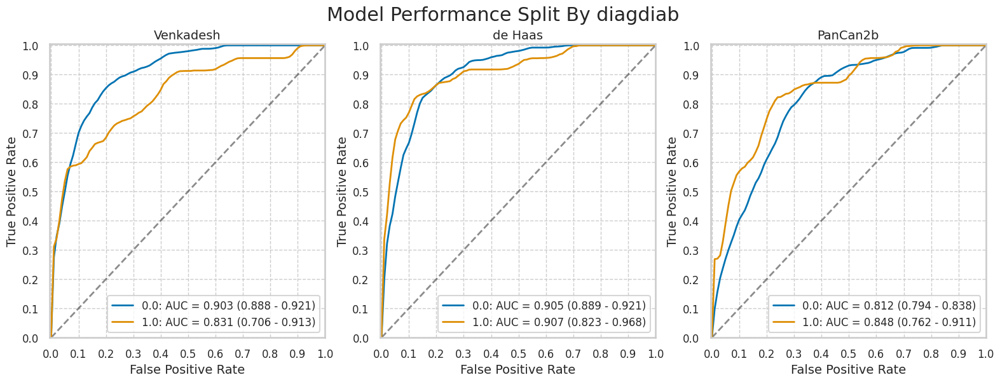

diagemph


,num,pct,num_mal,pct_mal
0.0,2908,89.86403,253,8.700138
1.0,328,10.13597,28,8.536585


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2908,234,919,1736,19,0.924901,0.346139,0.075099,0.653861,0.202949,0.989174,0.797051,0.010826,0.677442
1.0,328,26,145,155,2,0.928571,0.483333,0.071429,0.516667,0.152047,0.987261,0.847953,0.012739,0.551829


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2908,243,1173,1482,10,0.960474,0.441808,0.039526,0.558192,0.17161,0.993298,0.82839,0.006702,0.593191
1.0,328,28,147,153,0,1.000000,0.490000,0.000000,0.510000,0.16000,1.000000,0.84000,0.000000,0.551829


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2908,227,1151,1504,26,0.897233,0.433522,0.102767,0.566478,0.164731,0.983007,0.835269,0.016993,0.595254
1.0,328,26,164,136,2,0.928571,0.546667,0.071429,0.453333,0.136842,0.985507,0.863158,0.014493,0.493902


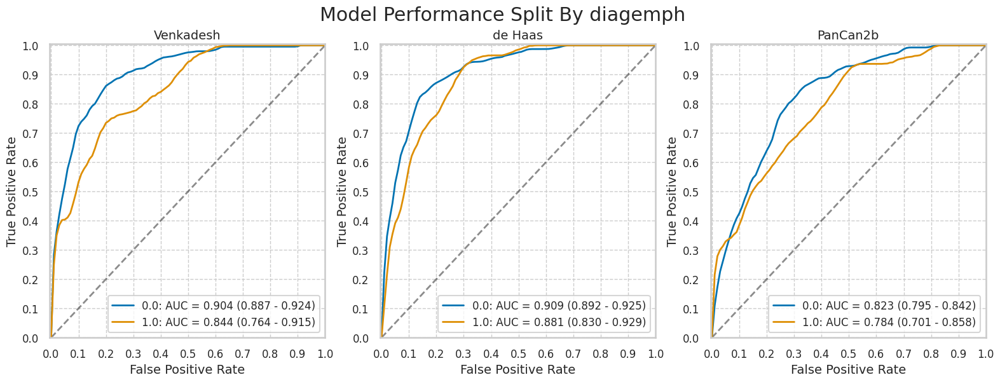

diagfibr


,num,pct,num_mal,pct_mal
0.0,3230,99.691358,281,8.69969
1.0,10,0.308642,0,0.00000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diaghear


,num,pct,num_mal,pct_mal
0.0,2820,87.306502,250,8.865248
1.0,410,12.693498,31,7.560976


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2820,231,909,1661,19,0.924000,0.353696,0.076000,0.646304,0.202632,0.988690,0.797368,0.011310,0.670922
1.0,410,29,156,223,2,0.935484,0.411609,0.064516,0.588391,0.156757,0.991111,0.843243,0.008889,0.614634


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2820,241,1164,1406,9,0.964000,0.452918,0.036000,0.547082,0.17153,0.993640,0.82847,0.006360,0.584043
1.0,410,30,156,223,1,0.967742,0.411609,0.032258,0.588391,0.16129,0.995536,0.83871,0.004464,0.617073


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2820,224,1126,1444,26,0.896000,0.438132,0.104000,0.561868,0.165926,0.982313,0.834074,0.017687,0.591489
1.0,410,29,187,192,2,0.935484,0.493404,0.064516,0.506596,0.134259,0.989691,0.865741,0.010309,0.539024


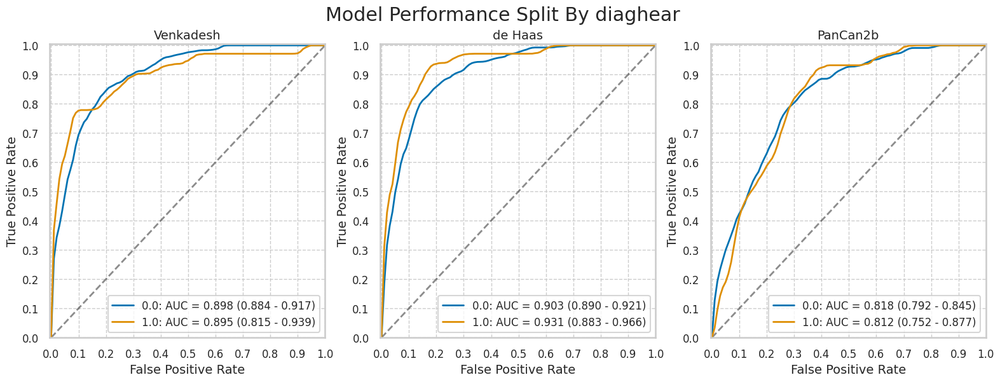

diaghype


,num,pct,num_mal,pct_mal
0.0,2185,67.521632,183,8.375286
1.0,1051,32.478368,95,9.039010


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2185,171,726,1276,12,0.934426,0.362637,0.065574,0.637363,0.190635,0.990683,0.809365,0.009317,0.662243
1.0,1051,86,339,617,9,0.905263,0.354603,0.094737,0.645397,0.202353,0.985623,0.797647,0.014377,0.668887


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2185,177,890,1112,6,0.967213,0.444555,0.032787,0.555445,0.165886,0.994633,0.834114,0.005367,0.589931
1.0,1051,91,430,526,4,0.957895,0.449791,0.042105,0.550209,0.174664,0.992453,0.825336,0.007547,0.587060


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2185,166,895,1107,17,0.907104,0.447053,0.092896,0.552947,0.156456,0.984875,0.843544,0.015125,0.582609
1.0,1051,84,422,534,11,0.884211,0.441423,0.115789,0.558577,0.166008,0.979817,0.833992,0.020183,0.588011


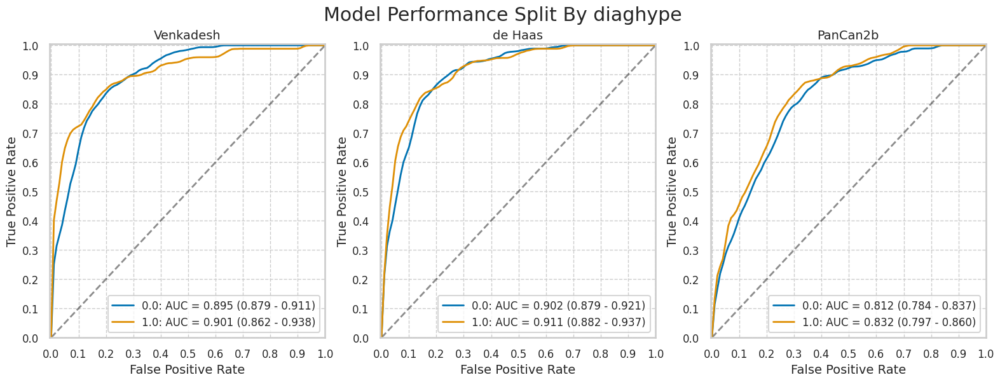

diagpneu


,num,pct,num_mal,pct_mal
0.0,2496,77.179963,220,8.814103
1.0,738,22.820037,61,8.265583


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2496,203,796,1480,17,0.922727,0.349736,0.077273,0.650264,0.203203,0.988644,0.796797,0.011356,0.674279
1.0,738,57,269,408,4,0.934426,0.397341,0.065574,0.602659,0.174847,0.990291,0.825153,0.009709,0.630081


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2496,213,1016,1260,7,0.968182,0.446397,0.031818,0.553603,0.173312,0.994475,0.826688,0.005525,0.590144
1.0,738,58,303,374,3,0.950820,0.447563,0.049180,0.552437,0.160665,0.992042,0.839335,0.007958,0.585366


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2496,198,954,1322,22,0.900000,0.419156,0.100000,0.580844,0.171875,0.983631,0.828125,0.016369,0.608974
1.0,738,55,362,315,6,0.901639,0.534712,0.098361,0.465288,0.131894,0.981308,0.868106,0.018692,0.501355


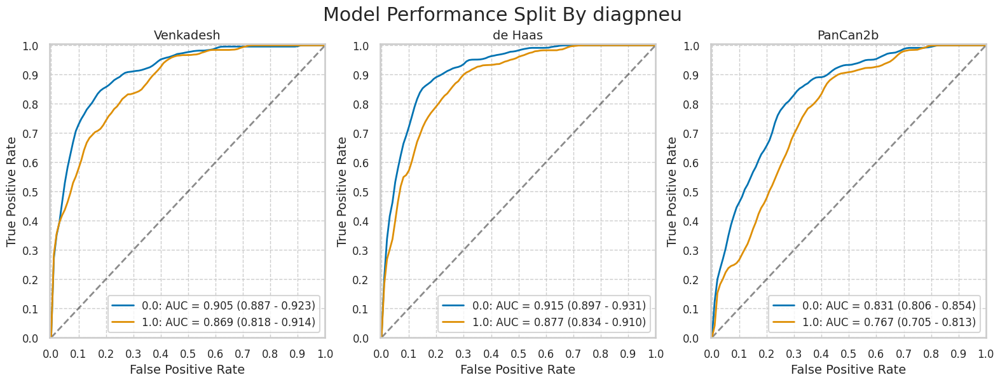

diagsarc


,num,pct,num_mal,pct_mal
0.0,3238,99.938272,280,8.647313
1.0,2,0.061728,1,50.000000


KeyboardInterrupt: 

In [14]:
for cat in nlst_democols['cat']['disease']:
    print(cat)
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

height


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,67.886448,3.719267,59.0,65.0,68.0,71.0,78.0
1,280.0,68.335714,3.618175,60.0,66.0,69.0,71.0,76.0


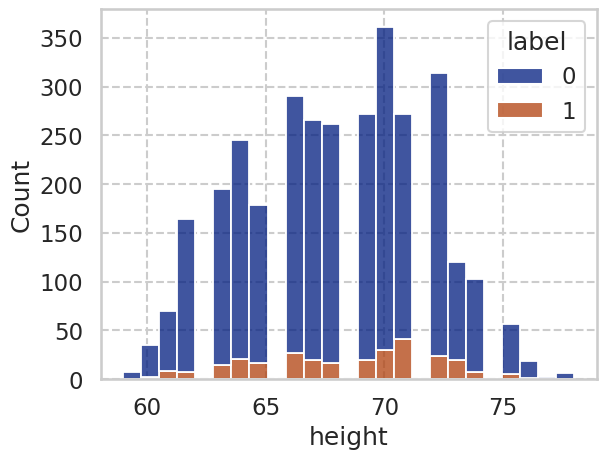

weight


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2957.0,182.767332,39.320755,90.0,155.0,178.0,207.0,322.0
1,281.0,175.893238,35.314748,108.0,150.0,175.0,196.0,322.0


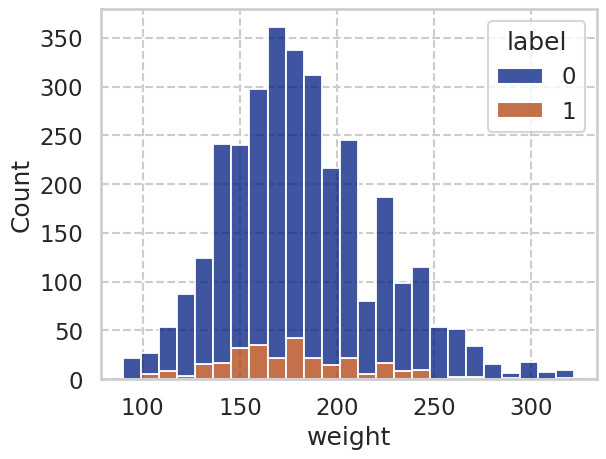

Age


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,63.451504,5.221943,55.0,59.0,63.0,67.0,76.0
1,281.0,64.320285,5.000419,55.0,61.0,64.0,68.0,75.0


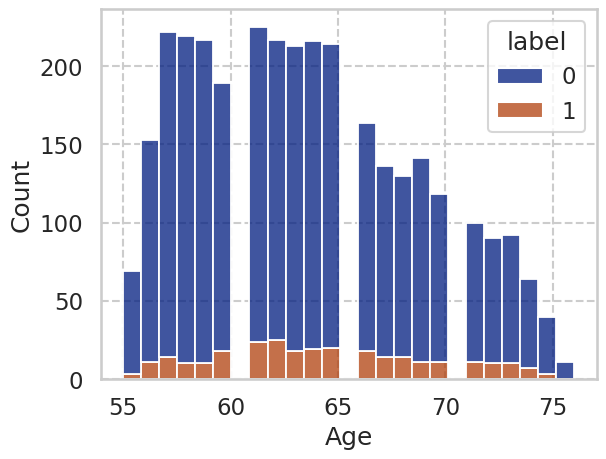

In [15]:
for c in nlst_democols['num']['demo']:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

,count,mean,std,min,25%,50%,75%,max
bin_Age,,,,,,,,
"[55, 60)",880.0,0.054545,0.227220,0.0,0.0,0.0,0.0,1.0
"[60, 65)",1060.0,0.098113,0.297608,0.0,0.0,0.0,0.0,1.0
"[65, 70)",785.0,0.098089,0.297625,0.0,0.0,0.0,0.0,1.0
"[70, 78)",515.0,0.100971,0.301583,0.0,0.0,0.0,0.0,1.0


,num,pct,num_mal,pct_mal
"[55, 60)",880,27.160494,48,5.454545
"[60, 65)",1060,32.716049,104,9.811321
"[65, 70)",785,24.228395,77,9.808917
"[70, 78)",515,15.895062,52,10.097087


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",880,44,279,553,4,0.916667,0.335337,0.083333,0.664663,0.136223,0.992819,0.863777,0.007181,0.678409
"[60, 65)",1060,95,329,627,9,0.913462,0.344142,0.086538,0.655858,0.224057,0.985849,0.775943,0.014151,0.681132
"[65, 70)",785,72,276,432,5,0.935065,0.389831,0.064935,0.610169,0.206897,0.988558,0.793103,0.011442,0.642038
"[70, 78)",515,49,181,282,3,0.942308,0.390929,0.057692,0.609071,0.213043,0.989474,0.786957,0.010526,0.642718


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",880,47,413,419,1,0.979167,0.496394,0.020833,0.503606,0.102174,0.997619,0.897826,0.002381,0.529545
"[60, 65)",1060,97,380,576,7,0.932692,0.397490,0.067308,0.602510,0.203354,0.987993,0.796646,0.012007,0.634906
"[65, 70)",785,75,295,413,2,0.974026,0.416667,0.025974,0.583333,0.202703,0.995181,0.797297,0.004819,0.621656
"[70, 78)",515,52,232,231,0,1.000000,0.501080,0.000000,0.498920,0.183099,1.000000,0.816901,0.000000,0.549515


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",880,41,324,508,7,0.854167,0.389423,0.145833,0.610577,0.112329,0.986408,0.887671,0.013592,0.623864
"[60, 65)",1060,94,407,549,10,0.903846,0.425732,0.096154,0.574268,0.187625,0.982111,0.812375,0.017889,0.606604
"[65, 70)",785,71,322,386,6,0.922078,0.454802,0.077922,0.545198,0.180662,0.984694,0.819338,0.015306,0.582166
"[70, 78)",515,47,265,198,5,0.903846,0.572354,0.096154,0.427646,0.150641,0.975369,0.849359,0.024631,0.475728


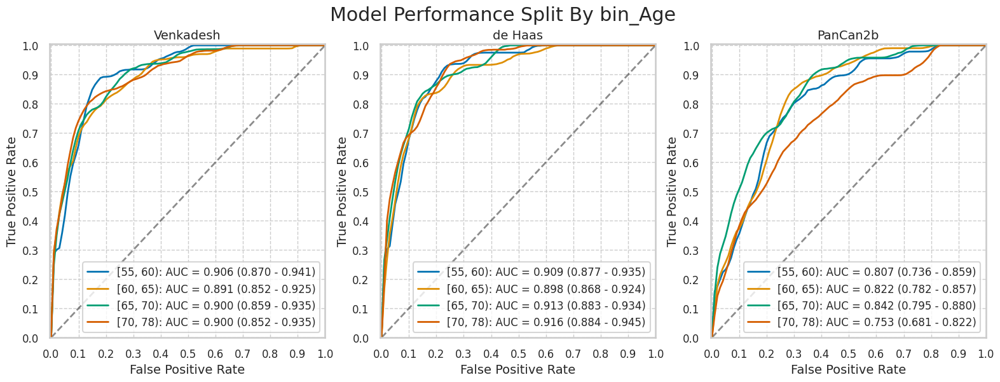

,num,pct,num_mal,pct_mal
"[55, 60)",880,27.160494,48,5.454545
"[60, 65)",1060,32.716049,104,9.811321
"[65, 70)",785,24.228395,77,9.808917
"[70, 78)",515,15.895062,52,10.097087


In [16]:
nlst_preds['bin_Age'] = pd.cut(nlst_preds['Age'], bins=[55, 60, 65, 70, 78], right=False)
display(nlst_preds.groupby('bin_Age')['label'].describe())
plot_by_category(nlst_preds, f'bin_Age')

label                                               height  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_height                                                                
(48, 68]    1713.0  0.077058  0.266761  0.0  0.0  0.0  0.0  1.0  1713.0   
(68, 88]    1526.0  0.096986  0.296035  0.0  0.0  0.0  0.0  1.0  1526.0   

                                                               
                 mean       std   min   25%   50%   75%   max  
bin_height                                                     
(48, 68]    64.990660  2.222949  59.0  63.0  65.0  67.0  68.0  
(68, 88]    71.219528  1.783248  69.0  70.0  71.0  72.0  78.0

,num,pct,num_mal,pct_mal
"(48, 68]",1713,52.886693,132,7.705779
"(68, 88]",1526,47.113307,148,9.698558


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",1713,119,590,991,13,0.901515,0.373182,0.098485,0.626818,0.167842,0.987052,0.832158,0.012948,0.647986
"(68, 88]",1526,140,475,903,8,0.945946,0.344702,0.054054,0.655298,0.227642,0.991218,0.772358,0.008782,0.683486


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",1713,126,722,859,6,0.954545,0.456673,0.045455,0.543327,0.148585,0.993064,0.851415,0.006936,0.575015
"(68, 88]",1526,144,598,780,4,0.972973,0.433962,0.027027,0.566038,0.194070,0.994898,0.805930,0.005102,0.605505


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",1713,116,776,805,16,0.878788,0.490829,0.121212,0.509171,0.130045,0.980512,0.869955,0.019488,0.537653
"(68, 88]",1526,136,542,836,12,0.918919,0.393324,0.081081,0.606676,0.200590,0.985849,0.799410,0.014151,0.636959


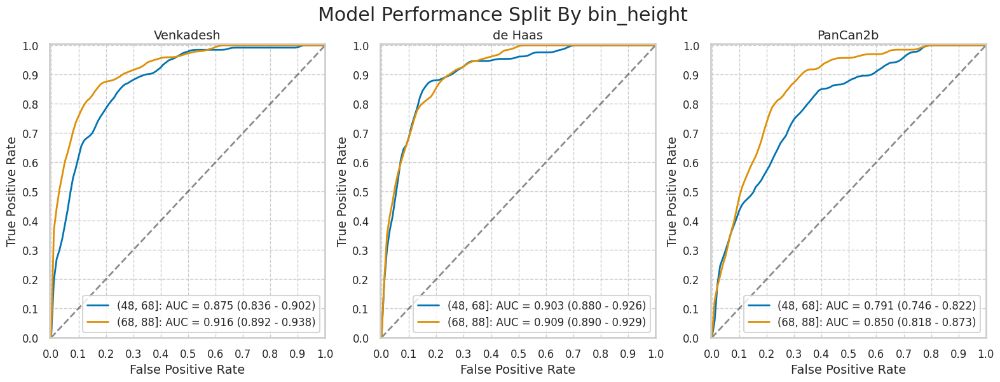

,num,pct,num_mal,pct_mal
"(48, 68]",1713,52.886693,132,7.705779
"(68, 88]",1526,47.113307,148,9.698558


In [17]:
nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
plot_by_category(nlst_preds, f'bin_height')

label                                               weight  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_weight                                                                
(79, 179]   1642.0  0.093179  0.290772  0.0  0.0  0.0  0.0  1.0  1642.0   
(179, 279]  1541.0  0.081765  0.274095  0.0  0.0  0.0  0.0  1.0  1541.0   

                                                                      
                  mean        std    min    25%    50%    75%    max  
bin_weight                                                            
(79, 179]   151.954324  18.896936   90.0  140.0  155.0  167.0  179.0  
(179, 279]  210.236859  23.974669  180.0  190.0  205.0  225.0  275.0

,num,pct,num_mal,pct_mal
"(79, 179]",1642,51.586554,153,9.317905
"(179, 279]",1541,48.413446,126,8.176509


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",1642,144,602,887,9,0.941176,0.404298,0.058824,0.595702,0.193029,0.989955,0.806971,0.010045,0.627893
"(179, 279]",1541,115,448,967,11,0.912698,0.316608,0.087302,0.683392,0.204263,0.988753,0.795737,0.011247,0.702141


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",1642,151,725,764,2,0.986928,0.486904,0.013072,0.513096,0.172374,0.997389,0.827626,0.002611,0.557247
"(179, 279]",1541,118,577,838,8,0.936508,0.407774,0.063492,0.592226,0.169784,0.990544,0.830216,0.009456,0.620376


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",1642,136,744,745,17,0.888889,0.499664,0.111111,0.500336,0.154545,0.977690,0.845455,0.022310,0.536541
"(179, 279]",1541,115,550,865,11,0.912698,0.388693,0.087302,0.611307,0.172932,0.987443,0.827068,0.012557,0.635951


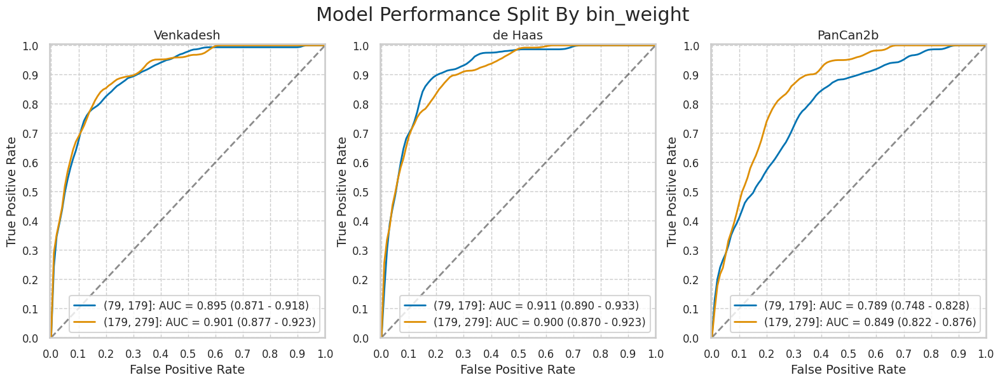

,num,pct,num_mal,pct_mal
"(79, 179]",1642,51.586554,153,9.317905
"(179, 279]",1541,48.413446,126,8.176509


In [18]:
nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
plot_by_category(nlst_preds, f'bin_weight')

### Smoking columns

pkyr


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,56.730618,22.852350,30.0,40.0,50.0,66.0,177.0
1,281.0,67.787189,25.508996,30.0,49.0,62.0,84.0,224.0


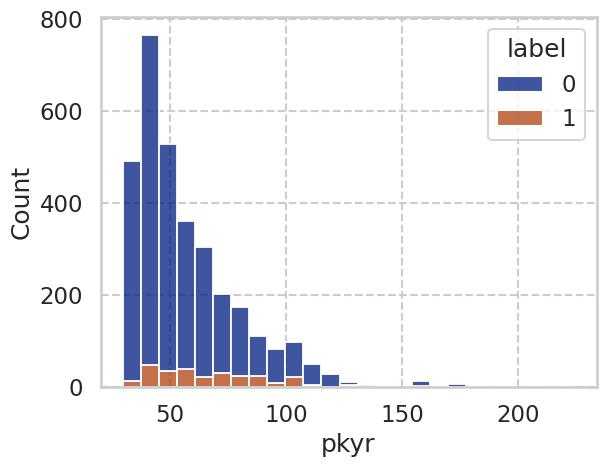

smokeage


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,16.608314,3.417384,5.0,14.0,16.0,18.0,40.0
1,281.0,16.352313,3.291830,8.0,14.0,16.0,18.0,27.0


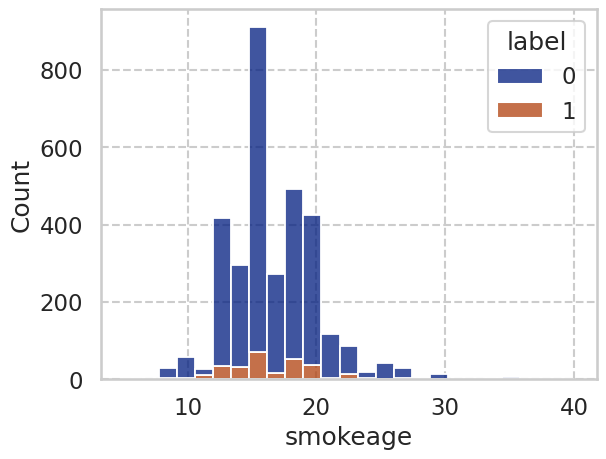

smokeday


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,28.384927,11.879929,12.0,20.0,25.0,30.0,100.0
1,281.0,30.886121,11.025677,15.0,20.0,30.0,40.0,80.0


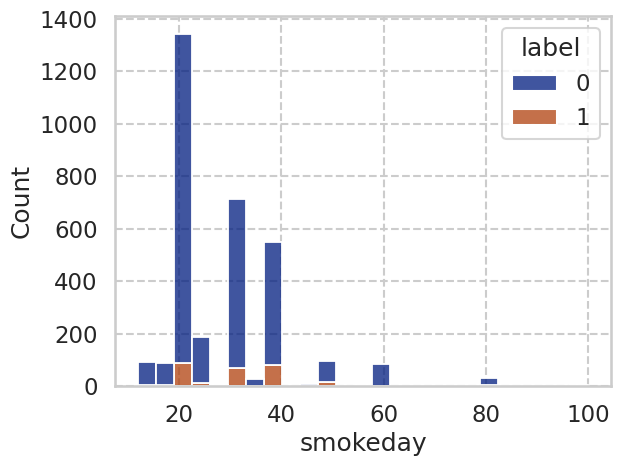

smokeyr


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,40.785738,7.476313,17.0,36.0,41.0,46.0,61.0
1,281.0,44.302491,7.098614,26.0,40.0,44.0,49.0,65.0


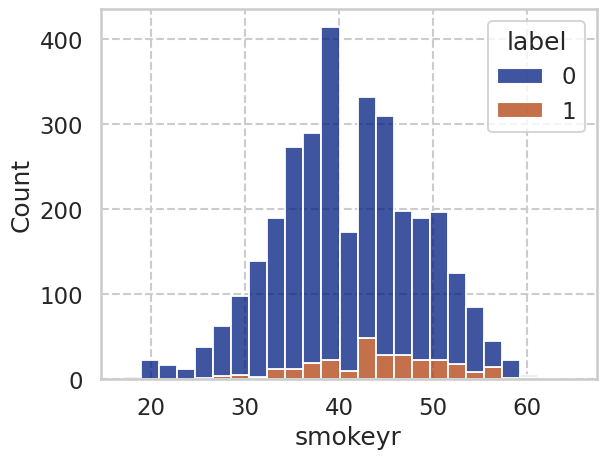

In [19]:
for c in nlst_democols['num']['smoke']:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                                 pkyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_pkyr                                                                      
(29.999, 51.0]  1664.0  0.051683  0.221452  0.0  0.0  0.0  0.0  1.0  1664.0   
(51.0, 224.0]   1576.0  0.123731  0.329379  0.0  0.0  0.0  0.0  1.0  1576.0   

                                                                      
                     mean        std    min   25%   50%   75%    max  
bin_pkyr                                                              
(29.999, 51.0]  40.966076   5.758863  30.00  37.0  41.0  45.0   51.0  
(51.0, 224.0]   75.346796  21.769836  51.25  58.5  69.0  86.0  224.0

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",1664,51.358025,86,5.168269
"(51.0, 224.0]",1576,48.641975,195,12.373096


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",1664,78,547,1031,8,0.906977,0.346641,0.093023,0.653359,0.1248,0.99230,0.8752,0.00770,0.666466
"(51.0, 224.0]",1576,182,518,863,13,0.933333,0.375091,0.066667,0.624909,0.2600,0.98516,0.7400,0.01484,0.663071


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",1664,82,709,869,4,0.953488,0.449303,0.046512,0.550697,0.103666,0.995418,0.896334,0.004582,0.571514
"(51.0, 224.0]",1576,189,611,770,6,0.969231,0.442433,0.030769,0.557567,0.236250,0.992268,0.763750,0.007732,0.608503


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",1664,79,682,896,7,0.918605,0.432193,0.081395,0.567807,0.103811,0.992248,0.896189,0.007752,0.585938
"(51.0, 224.0]",1576,174,636,745,21,0.892308,0.460536,0.107692,0.539464,0.214815,0.972585,0.785185,0.027415,0.583122


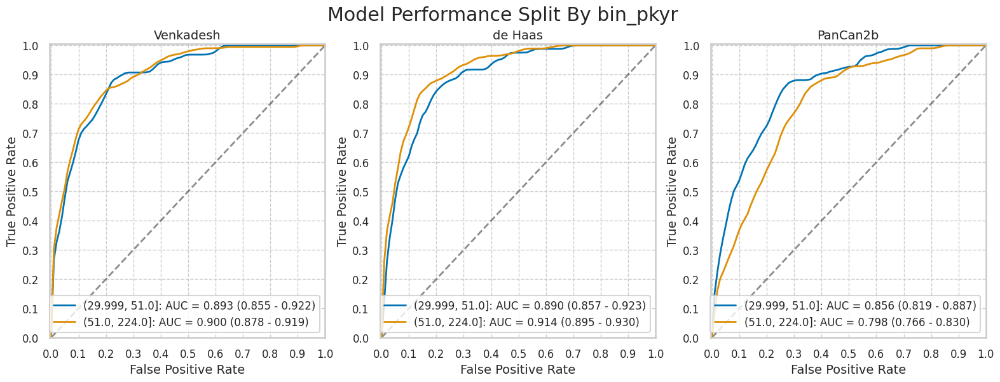

label                                              smokeage  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                  
(4.999, 16.0]  1737.0  0.088083  0.283497  0.0  0.0  0.0  0.0  1.0   1737.0   
(16.0, 40.0]   1503.0  0.085163  0.279217  0.0  0.0  0.0  0.0  1.0   1503.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(4.999, 16.0]  14.174439  1.760444   5.0  13.0  15.0  16.0  16.0  
(16.0, 40.0]   19.373253  2.636122  17.0  18.0  18.0  20.0  40.0

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",1737,53.611111,153,8.808290
"(16.0, 40.0]",1503,46.388889,128,8.516301


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1737,143,577,1007,10,0.934641,0.364268,0.065359,0.635732,0.198611,0.990167,0.801389,0.009833,0.662061
"(16.0, 40.0]",1503,117,488,887,11,0.914062,0.354909,0.085938,0.645091,0.193388,0.987751,0.806612,0.012249,0.667997


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1737,145,692,892,8,0.947712,0.436869,0.052288,0.563131,0.173238,0.991111,0.826762,0.008889,0.597006
"(16.0, 40.0]",1503,126,628,747,2,0.984375,0.456727,0.015625,0.543273,0.167109,0.997330,0.832891,0.002670,0.580838


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1737,134,705,879,19,0.875817,0.445076,0.124183,0.554924,0.159714,0.978842,0.840286,0.021158,0.583189
"(16.0, 40.0]",1503,119,613,762,9,0.929688,0.445818,0.070312,0.554182,0.162568,0.988327,0.837432,0.011673,0.586161


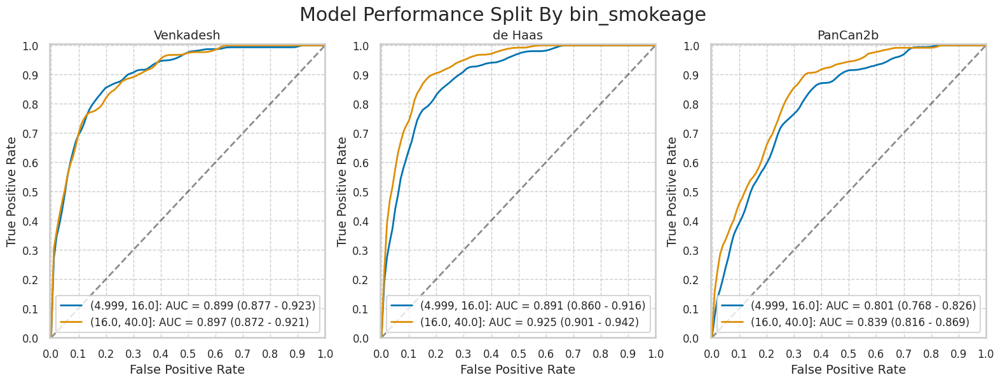

label                                              smokeday  \
                 count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                   
(11.999, 25.0]  1712.0  0.064252  0.245274  0.0  0.0  0.0  0.0  1.0   1712.0   
(25.0, 100.0]   1528.0  0.111911  0.315360  0.0  0.0  0.0  0.0  1.0   1528.0   

                                                                     
                     mean        std   min   25%   50%   75%    max  
bin_smokeday                                                         
(11.999, 25.0]  20.131425   2.134221  12.0  20.0  20.0  20.0   25.0  
(25.0, 100.0]   38.092277  11.002887  28.0  30.0  40.0  40.0  100.0

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",1712,52.839506,110,6.425234
"(25.0, 100.0]",1528,47.160494,171,11.191099


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1712,101,574,1028,9,0.918182,0.358302,0.081818,0.641698,0.149630,0.991321,0.850370,0.008679,0.659463
"(25.0, 100.0]",1528,159,491,866,12,0.929825,0.361828,0.070175,0.638172,0.244615,0.986333,0.755385,0.013667,0.670812


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1712,106,739,863,4,0.963636,0.461298,0.036364,0.538702,0.125444,0.995386,0.874556,0.004614,0.566005
"(25.0, 100.0]",1528,165,581,776,6,0.964912,0.428150,0.035088,0.571850,0.221180,0.992327,0.778820,0.007673,0.615838


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1712,102,723,879,8,0.927273,0.451311,0.072727,0.548689,0.123636,0.990981,0.876364,0.009019,0.573014
"(25.0, 100.0]",1528,151,595,762,20,0.883041,0.438467,0.116959,0.561533,0.202413,0.974425,0.797587,0.025575,0.597513


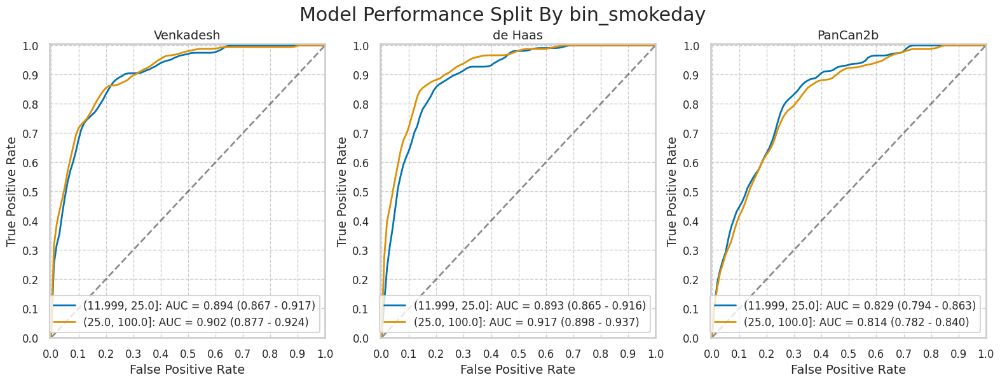

label                                              smokeyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                   
(16.999, 41.0]  1730.0  0.050867  0.219790  0.0  0.0  0.0  0.0  1.0  1730.0   
(41.0, 65.0]    1510.0  0.127815  0.333994  0.0  0.0  0.0  0.0  1.0  1510.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(16.999, 41.0]  35.542775  4.781479  17.0  33.0  37.0  40.0  41.0  
(41.0, 65.0]    47.447020  4.371368  42.0  44.0  47.0  50.0  65.0

,num,pct,num_mal,pct_mal
"(16.999, 41.0]",1730,53.395062,88,5.086705
"(41.0, 65.0]",1510,46.604938,193,12.781457


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",1730,83,564,1078,5,0.943182,0.343484,0.056818,0.656516,0.128284,0.995383,0.871716,0.004617,0.671098
"(41.0, 65.0]",1510,177,501,816,16,0.917098,0.380410,0.082902,0.619590,0.261062,0.980769,0.738938,0.019231,0.657616


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",1730,85,695,947,3,0.965909,0.423264,0.034091,0.576736,0.108974,0.996842,0.891026,0.003158,0.596532
"(41.0, 65.0]",1510,186,625,692,7,0.963731,0.474563,0.036269,0.525437,0.229346,0.989986,0.770654,0.010014,0.581457


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",1730,79,675,967,9,0.897727,0.411084,0.102273,0.588916,0.104775,0.990779,0.895225,0.009221,0.604624
"(41.0, 65.0]",1510,174,643,674,19,0.901554,0.488231,0.098446,0.511769,0.212974,0.972583,0.787026,0.027417,0.561589


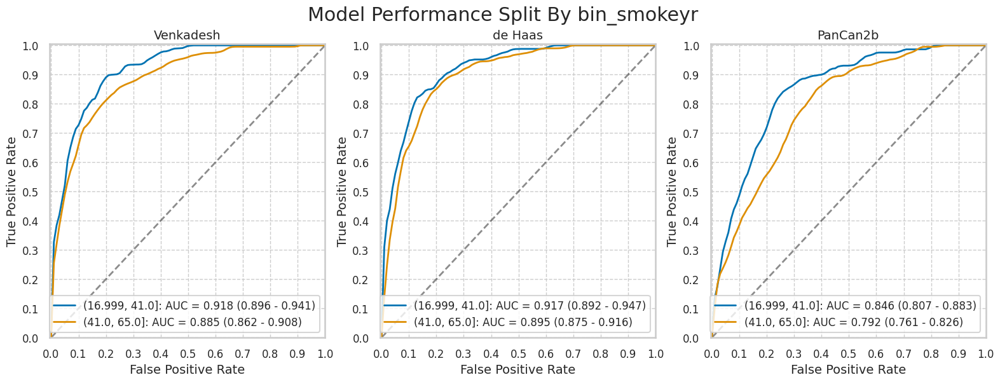

In [20]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

Diameter [mm]


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,7.470260,4.248909,4.0,4.9,6.1,8.4,44.4
1,281.0,14.009964,9.736201,4.1,8.2,11.5,16.9,83.0


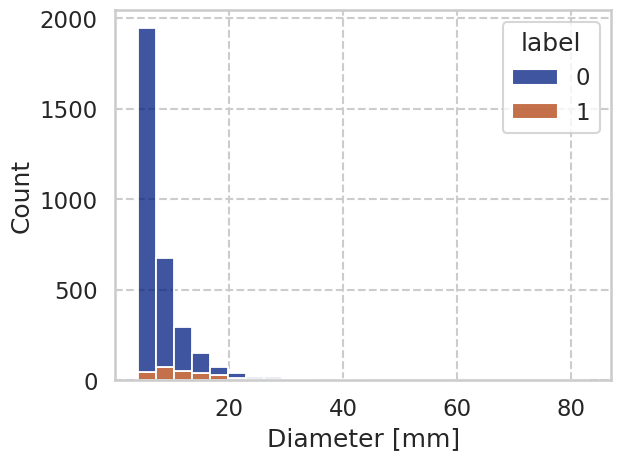

NoduleCounts


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,2.566746,1.708722,1.0,1.0,2.0,4.0,11.0
1,281.0,2.391459,1.474715,1.0,1.0,2.0,3.0,10.0


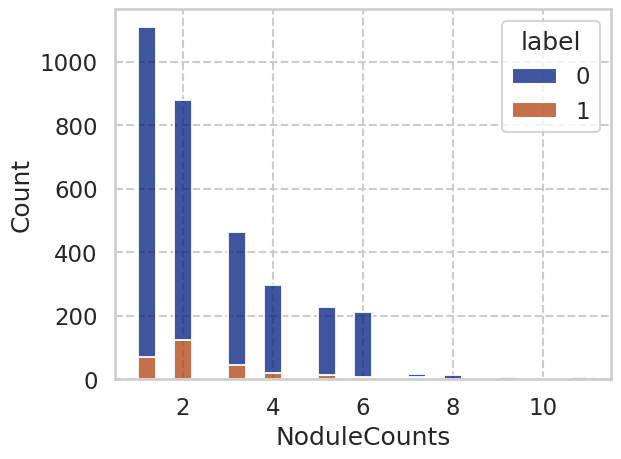

In [21]:
included_num_cols = ["Diameter [mm]", "NoduleCounts"]
for c in included_num_cols:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                               \
                    count      mean       std  min  25%  50%  75%  max   
bin_Diameter [mm]                                                        
(3.999, 6.3]       1657.0  0.020519  0.141810  0.0  0.0  0.0  0.0  1.0   
(6.3, 83.0]        1583.0  0.156033  0.363001  0.0  0.0  0.0  0.0  1.0   

                  Diameter [mm]                                            \
                          count       mean       std  min  25%  50%   75%   
bin_Diameter [mm]                                                           
(3.999, 6.3]             1657.0   5.058540  0.665707  4.0  4.5  5.0   5.6   
(6.3, 83.0]              1583.0  11.155591  6.163079  6.4  7.5  9.1  12.7   

                         
                    max  
bin_Diameter [mm]        
(3.999, 6.3]        6.3  
(6.3, 83.0]        83.0

,num,pct,num_mal,pct_mal
"(3.999, 6.3]",1657,51.141975,34,2.051901
"(6.3, 83.0]",1583,48.858025,247,15.603285


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.3]",1657,28,276,1347,6,0.823529,0.170055,0.176471,0.829945,0.092105,0.995565,0.907895,0.004435,0.829813
"(6.3, 83.0]",1583,232,789,547,15,0.939271,0.590569,0.060729,0.409431,0.227228,0.973310,0.772772,0.026690,0.492104


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.3]",1657,32,519,1104,2,0.941176,0.319778,0.058824,0.680222,0.058076,0.998192,0.941924,0.001808,0.685576
"(6.3, 83.0]",1583,239,801,535,8,0.967611,0.599551,0.032389,0.400449,0.229808,0.985267,0.770192,0.014733,0.488945


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.3]",1657,10,169,1454,24,0.294118,0.104128,0.705882,0.895872,0.055866,0.983762,0.944134,0.016238,0.883524
"(6.3, 83.0]",1583,243,1149,187,4,0.983806,0.860030,0.016194,0.139970,0.174569,0.979058,0.825431,0.020942,0.271636


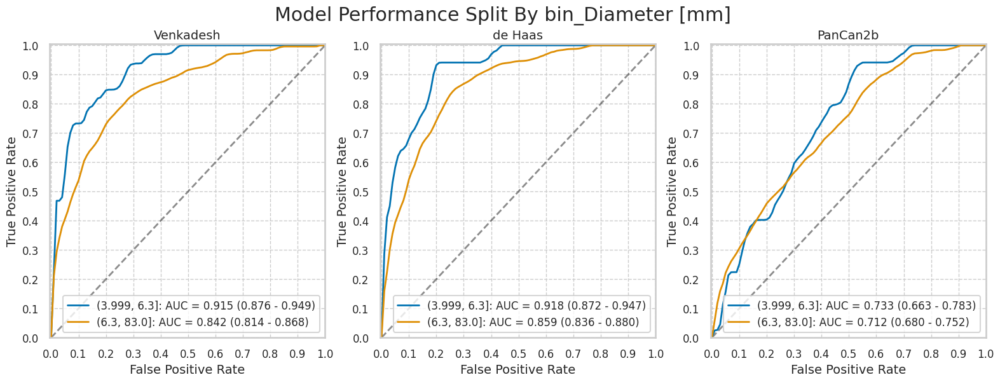

label                                               \
                   count      mean       std  min  25%  50%  75%  max   
bin_NoduleCounts                                                        
(0.999, 2.0]      1989.0  0.098039  0.297442  0.0  0.0  0.0  0.0  1.0   
(2.0, 11.0]       1251.0  0.068745  0.253121  0.0  0.0  0.0  0.0  1.0   

                 NoduleCounts                                                
                        count      mean       std  min  25%  50%  75%   max  
bin_NoduleCounts                                                             
(0.999, 2.0]           1989.0  1.441931  0.496741  1.0  1.0  1.0  2.0   2.0  
(2.0, 11.0]            1251.0  4.315747  1.391483  3.0  3.0  4.0  5.0  11.0

,num,pct,num_mal,pct_mal
"(0.999, 2.0]",1989,61.388889,195,9.803922
"(2.0, 11.0]",1251,38.611111,86,6.874500


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",1989,181,686,1108,14,0.928205,0.382386,0.071795,0.617614,0.208766,0.987522,0.791234,0.012478,0.648064
"(2.0, 11.0]",1251,79,379,786,7,0.918605,0.325322,0.081395,0.674678,0.172489,0.991173,0.827511,0.008827,0.691447


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",1989,189,941,853,6,0.969231,0.524526,0.030769,0.475474,0.167257,0.993015,0.832743,0.006985,0.523881
"(2.0, 11.0]",1251,82,379,786,4,0.953488,0.325322,0.046512,0.674678,0.177874,0.994937,0.822126,0.005063,0.693845


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",1989,174,939,855,21,0.892308,0.523411,0.107692,0.476589,0.156334,0.976027,0.843666,0.023973,0.517345
"(2.0, 11.0]",1251,79,379,786,7,0.918605,0.325322,0.081395,0.674678,0.172489,0.991173,0.827511,0.008827,0.691447


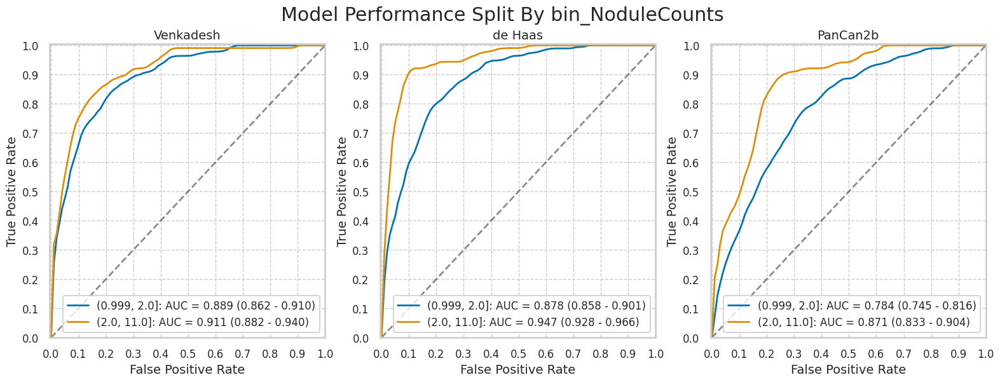

In [22]:
for c in included_num_cols:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

## Further binning categorical columns

In [23]:
nlst_preds[['race', 'ethnic']].value_counts()

race  ethnic
1.0   2.0       2994
2.0   2.0        107
3.0   2.0         35
6.0   2.0         35
1.0   1.0         23
4.0   2.0         20
5.0   2.0          9
2.0   1.0          1
Name: count, dtype: int64

,num,pct,num_mal,pct_mal
False,246,7.592593,33,13.414634
True,2994,92.407407,248,8.283233


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,246,29,107,106,4,0.878788,0.502347,0.121212,0.497653,0.213235,0.963636,0.786765,0.036364,0.548780
True,2994,231,958,1788,17,0.931452,0.348871,0.068548,0.651129,0.194281,0.990582,0.805719,0.009418,0.674349


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,246,32,114,99,1,0.969697,0.535211,0.030303,0.464789,0.219178,0.99000,0.780822,0.01000,0.532520
True,2994,239,1206,1540,9,0.963710,0.439184,0.036290,0.560816,0.165398,0.99419,0.834602,0.00581,0.594188


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,246,28,109,104,5,0.848485,0.511737,0.151515,0.488263,0.204380,0.954128,0.795620,0.045872,0.536585
True,2994,225,1209,1537,23,0.907258,0.440277,0.092742,0.559723,0.156904,0.985256,0.843096,0.014744,0.588510


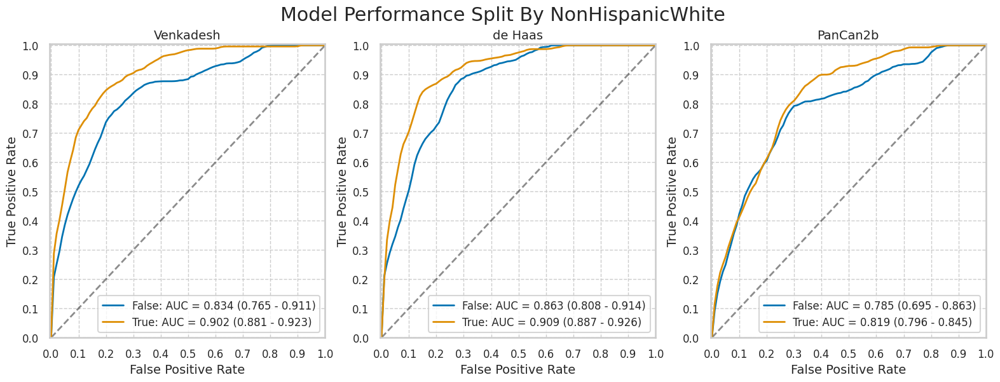

,num,pct,num_mal,pct_mal
False,246,7.592593,33,13.414634
True,2994,92.407407,248,8.283233


In [24]:
non_hispanic_white = (nlst_preds['race'] == 1.0) & (nlst_preds['ethnic'] == 2.0)
nlst_preds['NonHispanicWhite'] = non_hispanic_white
plot_by_category(nlst_preds, 'NonHispanicWhite')

,num,pct,num_mal,pct_mal
False,75,2.314815,7,9.333333
True,3165,97.685185,274,8.657188


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,75,5,28,40,2,0.714286,0.411765,0.285714,0.588235,0.151515,0.952381,0.848485,0.047619,0.600000
True,3165,255,1037,1854,19,0.930657,0.358699,0.069343,0.641301,0.197368,0.989856,0.802632,0.010144,0.666351


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,75,7,32,36,0,1.000000,0.470588,0.000000,0.529412,0.179487,1.0000,0.820513,0.0000,0.573333
True,3165,264,1288,1603,10,0.963504,0.445521,0.036496,0.554479,0.170103,0.9938,0.829897,0.0062,0.589889


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,75,7,36,32,0,1.00000,0.529412,0.00000,0.470588,0.162791,1.000000,0.837209,0.000000,0.520000
True,3165,246,1282,1609,28,0.89781,0.443445,0.10219,0.556555,0.160995,0.982896,0.839005,0.017104,0.586098


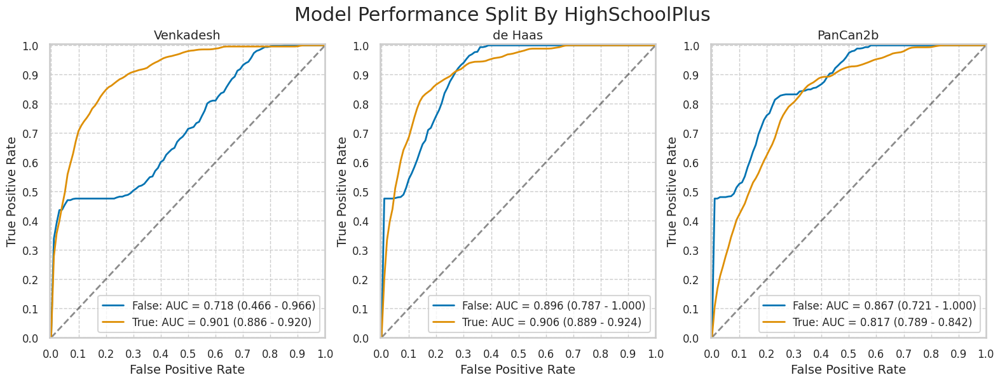

,num,pct,num_mal,pct_mal
False,75,2.314815,7,9.333333
True,3165,97.685185,274,8.657188


In [25]:
high_school_plus = (nlst_preds['educat'] != 1.0)
nlst_preds['HighSchoolPlus'] = high_school_plus
plot_by_category(nlst_preds, 'HighSchoolPlus')

,num,pct,num_mal,pct_mal
False,1058,32.654321,93,8.790170
True,2182,67.345679,188,8.615949


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1058,86,374,591,7,0.924731,0.387565,0.075269,0.612435,0.186957,0.988294,0.813043,0.011706,0.639887
True,2182,174,691,1303,14,0.925532,0.346540,0.074468,0.653460,0.201156,0.989370,0.798844,0.010630,0.676902


de Haas


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1058,89,490,475,4,0.956989,0.507772,0.043011,0.492228,0.153713,0.991649,0.846287,0.008351,0.533081
True,2182,182,830,1164,6,0.968085,0.416249,0.031915,0.583751,0.179842,0.994872,0.820158,0.005128,0.616865


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1058,82,505,460,11,0.881720,0.523316,0.118280,0.476684,0.139693,0.976645,0.860307,0.023355,0.512287
True,2182,171,813,1181,17,0.909574,0.407723,0.090426,0.592277,0.173780,0.985810,0.826220,0.014190,0.619615


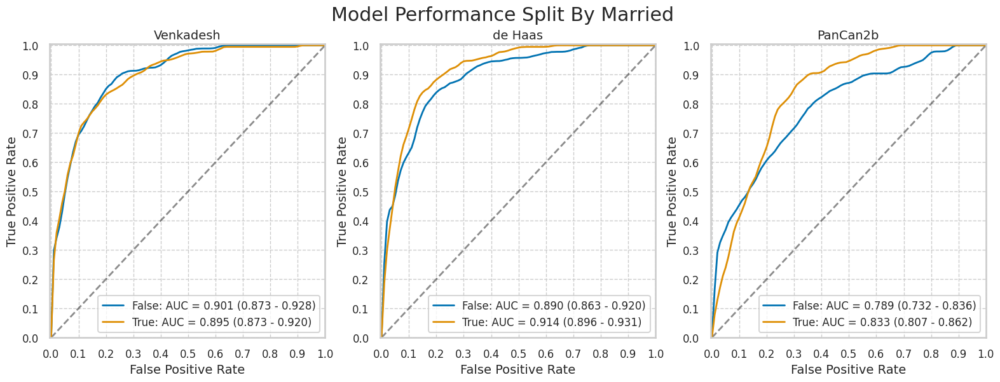

,num,pct,num_mal,pct_mal
False,1058,32.654321,93,8.790170
True,2182,67.345679,188,8.615949


In [26]:
married = (nlst_preds['marital'] == 2.0)
nlst_preds['Married'] = married
plot_by_category(nlst_preds, 'Married')